In [1]:
# scipy.io.savemat('data/1/data.mat',dict([('ks_data_origin',ks_data_origin),
#                 ('b.output_w',b.output_w),('rmse',rmse),('rmse_vec',rmse_vec),
#                 ('rmse_vert',rmse_vert),('pred_output',pred_output),('xx_',xx_),
#                 ('tt',tt)]))

In [1]:
#!/usr/bin/python

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import scipy.io
# import os
# import sys
import numpy as np

import time

from reservoir import Reservoir
import data1D
import data_utils

%load_ext autoreload
%autoreload 2
%aimport data1D
%aimport reservoir


%matplotlib inline
import matplotlib.pyplot as plt

# setx PATH "%PATH%;C:\Octave\Octave-5.1.0.0

In [2]:
# Input data
n_sequence=1
spatial_points = 65
lyap_exp = 0.0461
n_train = 1000
n_test = 1000
forget = 100
parallel_runs = 1
ks_data_origin, xx, tt = data1D.kuramoto_sivashinsky_from_dataset(sequence_length=n_train+n_test, n_sequence=n_sequence)
# ks_data_origin=ks_data_origin+np.random.rand(ks_data_origin.shape[0],ks_data_origin.shape[1],ks_data_origin.shape[2])
ks_data_train = ks_data_origin[:, :n_train, :]
input_shape=ks_data_train.shape

In [7]:
b.res_w

array([[ 0.00909137+0.01324486j, -0.00676817-0.01767495j,
         0.022368  +0.0237184j , ...,  0.06519445-0.01510408j,
         0.04264424-0.0122813j , -0.02857003+0.01391875j],
       [-0.02352707+0.02273009j, -0.02771795-0.00303296j,
         0.0066679 -0.00154774j, ..., -0.01432568-0.01011296j,
        -0.02040652+0.01135611j, -0.0078308 -0.03138361j],
       [-0.02472292+0.04997064j, -0.01689917-0.00809826j,
         0.04378823+0.02907417j, ...,  0.0061792 +0.01279703j,
         0.00018368+0.0054634j , -0.02255712-0.02626015j],
       ...,
       [-0.02609212-0.00503207j, -0.00225154-0.00568776j,
        -0.00336094-0.01990142j, ..., -0.03519196-0.01090417j,
        -0.00777328+0.00365689j,  0.02466729-0.01521735j],
       [ 0.00011834-0.00941162j,  0.01963816+0.0388614j ,
        -0.00384998-0.02805448j, ...,  0.01022699-0.00278165j,
         0.00474422-0.00684726j, -0.06138206-0.01297579j],
       [-0.02131566+0.03436279j, -0.00489611+0.02071003j,
         0.00521486-0.03487837

In [3]:
# b.activation_param0 = None
b = Reservoir(n_res=1000, res_scale=0.705, res_encoding=None,
#               remove_saturated_neurons=True, n_saturated_neurons=10, # reservoir cleanup 
              input_enc_param=np.pi, res_enc_param=None,
              input_scale=0.537, input_encoding='phase',
              scale_input_MinMax = (0, 1), scale_output_MinMax = (0, 1), # data standardization
              raw_input_feature = True, enc_input_feature = False, # concatenated states properties
              random_projection='LC_simulation', weights_type='gaussian',
              activation_fun='ceiling', activation_param=10,
              parallel_runs=parallel_runs, bias_scale=0, leak_rate=0.9,
              pred_horizon=1, rec_pred_steps=200, forget = forget,
              train_method='ridge', train_param=0.25, verbose=1
             )

# Algorithm training
b.fit(ks_data_train);

Reservoir Computing algorithm - Training phase:

Initialization complete. 		Elapsed time: 0.05667448043823242 s


[[-3.35267577e-02  8.58000798e-01 -1.18085582e+00  9.20534024e-01
  -8.63658759e-01 -7.49022124e-01  7.50003849e-02  4.67862325e-02
  -7.32957691e-01  5.44532218e-01  6.31725851e-01  3.64785818e-01
  -8.19088470e-01  1.14807961e+00 -1.07734379e+00 -6.60951029e-01
  -1.23024467e+00  7.59946648e-01  1.25614997e+00 -1.02936393e+00
  -7.53290304e-01 -1.09760325e+00  7.88477752e-01  4.77232499e-01
   1.28152279e+00 -1.21615911e+00 -1.31569946e+00  9.89997434e-01
  -3.00392224e-01  8.34923223e-01  4.68392029e-02 -1.30228776e+00
  -9.23343435e-01  6.14150819e-01  1.15359668e+00 -1.22503473e+00
  -1.17585885e+00 -1.02685282e+00 -2.49051059e-01 -7.85339032e-03
   8.31085328e-01  1.13364862e+00  8.14710488e-01 -6.26324431e-01
   6.15005541e-01 -3.78653812e-01  3.12415428e-01  6.91729904e-01
   3.85894677e-01 -6.45789549e-01 -7.95390695e-01  9.86510134e-01
  -8.88826462e-01 -2.81057763e-01  9.04976476e-01 -8.98394932e-01
  -8.66516641e-01 -4.10383367e-01  5.66908032e-02 -2.82614681e-01
  -9.22960

[[-3.63695917e-02  5.84664549e-01 -8.55845267e-01  7.18950928e-01
  -6.41328172e-01 -6.13672216e-01  8.14031420e-02  3.40169279e-02
  -5.66376223e-01  4.84816469e-01  4.30761861e-01  3.75083955e-01
  -6.39017345e-01  8.03995685e-01 -7.72769246e-01 -4.57130381e-01
  -9.15771931e-01  5.96910690e-01  8.51446519e-01 -6.46760570e-01
  -6.20852398e-01 -1.03823245e+00  5.13714090e-01  6.32704973e-01
   9.98793634e-01 -8.87627184e-01 -8.98529958e-01  6.97961754e-01
  -2.40899452e-01  4.92502302e-01  6.12707243e-02 -9.40914609e-01
  -8.38405692e-01  6.18798679e-01  8.28286352e-01 -8.42467902e-01
  -7.93003588e-01 -7.96384355e-01 -2.69544864e-01 -9.08976148e-03
   6.25566521e-01  8.03765154e-01  6.30544675e-01 -6.11597947e-01
   6.67072610e-01 -3.32657857e-01  2.26060659e-01  6.23616463e-01
   3.55950109e-01 -5.11290329e-01 -4.61324611e-01  8.80098748e-01
  -6.60172770e-01 -3.07517976e-01  7.99842871e-01 -8.71503029e-01
  -4.89496573e-01 -4.59956139e-01  7.13326677e-02 -2.97589735e-01
  -7.80254

[[-3.79239188e-02  4.89003335e-01 -7.50593129e-01  6.30719449e-01
  -5.51373882e-01 -5.49830729e-01  8.56740791e-02  2.72089677e-02
  -4.91371705e-01  4.60828884e-01  3.44436298e-01  3.68824364e-01
  -5.47803603e-01  6.84961047e-01 -6.71369493e-01 -3.82097857e-01
  -8.24365179e-01  5.16364258e-01  7.24732427e-01 -5.24537744e-01
  -5.51422723e-01 -9.72420845e-01  4.06950809e-01  7.23917065e-01
   9.04624745e-01 -7.97033526e-01 -7.80350428e-01  5.80894565e-01
  -2.06815667e-01  3.81887969e-01  7.23937362e-02 -8.38642424e-01
  -7.86527743e-01  6.17645084e-01  7.22372708e-01 -7.27274466e-01
  -6.84470353e-01 -7.11591040e-01 -2.85274118e-01 -9.96904237e-03
   5.35595566e-01  6.88261917e-01  5.49656475e-01 -5.92895068e-01
   6.74691302e-01 -3.11667458e-01  1.86242336e-01  5.87936216e-01
   3.35134330e-01 -4.45391824e-01 -3.48149491e-01  8.13578441e-01
  -5.72081267e-01 -3.31461875e-01  7.44541049e-01 -8.27891345e-01
  -3.69565566e-01 -4.85987438e-01  8.36501285e-02 -3.04051615e-01
  -6.96753

[[-3.95949763e-02  4.07613484e-01 -6.63841992e-01  5.46481007e-01
  -4.70777644e-01 -4.88433971e-01  9.08690808e-02  2.04469009e-02
  -4.20468285e-01  4.42220288e-01  2.66279940e-01  3.54109289e-01
  -4.56586022e-01  5.85061471e-01 -5.88422936e-01 -3.16516099e-01
  -7.54860535e-01  4.38700847e-01  6.15765988e-01 -4.23234824e-01
  -4.80746475e-01 -9.02721072e-01  3.11763794e-01  8.01786314e-01
   8.28729387e-01 -7.28462194e-01 -6.86039354e-01  4.75011341e-01
  -1.71347291e-01  2.93183141e-01  8.84129713e-02 -7.58667984e-01
  -7.30285539e-01  6.13118556e-01  6.32972713e-01 -6.35112852e-01
  -6.00447015e-01 -6.39484497e-01 -3.05670030e-01 -1.10988792e-02
   4.51114554e-01  5.86980830e-01  4.75683695e-01 -5.67942195e-01
   6.65642400e-01 -2.91770472e-01  1.48339679e-01  5.52617777e-01
   3.08987816e-01 -3.80810435e-01 -2.55632399e-01  7.46150913e-01
  -4.95678592e-01 -3.64219976e-01  6.92733291e-01 -7.70126371e-01
  -2.74265128e-01 -5.11867295e-01  1.02263772e-01 -3.08833955e-01
  -6.15668

[[-4.06713680e-02  3.64402143e-01 -6.18643476e-01  4.97331628e-01
  -4.26276984e-01 -4.53190257e-01  9.44581562e-02  1.66020610e-02
  -3.80001577e-01  4.34111329e-01  2.23669743e-01  3.41185092e-01
  -4.02780188e-01  5.32485766e-01 -5.45967307e-01 -2.80937087e-01
  -7.20512963e-01  3.94259385e-01  5.55917376e-01 -3.70246761e-01
  -4.38525922e-01 -8.62431549e-01  2.59796922e-01  8.30822622e-01
   7.90237513e-01 -6.95380795e-01 -6.37589412e-01  4.16526280e-01
  -1.50254918e-01  2.48479005e-01  1.01557924e-01 -7.18230123e-01
  -6.95337536e-01  6.08297702e-01  5.84749542e-01 -5.88667373e-01
  -5.59226912e-01 -6.01852348e-01 -3.20131816e-01 -1.19206562e-02
   4.03077769e-01  5.30852408e-01  4.34727364e-01 -5.50579859e-01
   6.52597973e-01 -2.80471155e-01  1.26854899e-01  5.32344291e-01
   2.90728080e-01 -3.43398259e-01 -2.08831380e-01  7.06915315e-01
  -4.54979262e-01 -3.88405516e-01  6.64549774e-01 -7.31147119e-01
  -2.26887290e-01 -5.26398739e-01  1.18020641e-01 -3.10485153e-01
  -5.70287

[[-4.28599356e-02  2.94261824e-01 -5.45905436e-01  4.09248172e-01
  -3.50390939e-01 -3.92007390e-01  1.02071700e-01  1.03508099e-02
  -3.09043847e-01  4.25340355e-01  1.54361896e-01  3.09812156e-01
  -3.07708106e-01  4.47252338e-01 -4.80443861e-01 -2.21546588e-01
  -6.66905301e-01  3.17837429e-01  4.54330959e-01 -2.85449185e-01
  -3.63662509e-01 -7.94300274e-01  1.74805888e-01  8.42290186e-01
   7.30118741e-01 -6.47224629e-01 -5.60166190e-01  3.19087874e-01
  -1.13536285e-01  1.79583220e-01  1.36539562e-01 -6.53519230e-01
  -6.30415728e-01  5.94192157e-01  5.03991256e-01 -5.18823531e-01
  -4.98091853e-01 -5.44156747e-01 -3.49214382e-01 -1.37722348e-02
   3.19992262e-01  4.34529849e-01  3.65659100e-01 -5.15279740e-01
   6.18115950e-01 -2.61121592e-01  9.07149195e-02  4.98366541e-01
   2.52773850e-01 -2.78154157e-01 -1.37908237e-01  6.39842411e-01
  -3.89454186e-01 -4.41195998e-01  6.20518790e-01 -6.55467341e-01
  -1.55869792e-01 -5.49070110e-01  1.61398997e-01 -3.10648991e-01
  -4.95618

[[-4.39777409e-02  2.65576669e-01 -5.15997770e-01  3.69903674e-01
  -3.17499949e-01 -3.65374810e-01  1.06113683e-01  7.95598272e-03
  -2.77485481e-01  4.23565706e-01  1.26674388e-01  2.92301572e-01
  -2.66390847e-01  4.12144783e-01 -4.55443366e-01 -1.96295738e-01
  -6.45062102e-01  2.85235194e-01  4.11302852e-01 -2.51333187e-01
  -3.31523289e-01 -7.65694723e-01  1.40837487e-01  8.33302846e-01
   7.06172161e-01 -6.29736317e-01 -5.28435172e-01  2.78852444e-01
  -9.80637983e-02  1.52668738e-01  1.59369873e-01 -6.26127044e-01
  -6.00990425e-01  5.85010253e-01  4.70238422e-01 -4.93353258e-01
  -4.75347451e-01 -5.23094646e-01 -3.61977499e-01 -1.48042205e-02
   2.84176834e-01  3.92949403e-01  3.36406459e-01 -4.98079092e-01
   5.99634162e-01 -2.52824840e-01  7.59205320e-02  4.84719175e-01
   2.33795010e-01 -2.49772547e-01 -1.11230005e-01  6.11994125e-01
  -3.63061284e-01 -4.68287646e-01  6.04376585e-01 -6.20160337e-01
  -1.29270212e-01 -5.57183576e-01  1.90686505e-01 -3.09619644e-01
  -4.65500

[[-4.57400439e-02  2.26754708e-01 -4.74767865e-01  3.13770636e-01
  -2.70742061e-01 -3.27352424e-01  1.13015249e-01  5.07173436e-03
  -2.31743081e-01  4.22277972e-01  9.09369496e-02  2.63302579e-01
  -2.09096602e-01  3.64155000e-01 -4.24090012e-01 -1.60685589e-01
  -6.14758145e-01  2.40308726e-01  3.52528938e-01 -2.05972378e-01
  -2.87938862e-01 -7.26186677e-01  9.74505633e-02  8.10865788e-01
   6.74288957e-01 -6.08237308e-01 -4.84744933e-01  2.24852974e-01
  -7.73271820e-02  1.17512563e-01  2.04237707e-01 -5.86104575e-01
  -5.59048237e-01  5.68066312e-01  4.25108091e-01 -4.63616815e-01
  -4.46930488e-01 -4.98784407e-01 -3.77016410e-01 -1.66040258e-02
   2.34493823e-01  3.34459645e-01  2.96067800e-01 -4.72343831e-01
   5.71474378e-01 -2.41031742e-01  5.65427987e-02  4.67410709e-01
   2.04530229e-01 -2.09671738e-01 -7.80125477e-02  5.74784552e-01
  -3.27761480e-01 -5.09816462e-01  5.85907591e-01 -5.68498222e-01
  -9.59765858e-02 -5.66530568e-01  2.50058690e-01 -3.07507032e-01
  -4.26106

[[-4.66293957e-02  2.08937720e-01 -4.55407042e-01  2.87161919e-01
  -2.48413197e-01 -3.08947381e-01  1.17011171e-01  3.94225821e-03
  -2.09582436e-01  4.21656262e-01  7.56444649e-02  2.47795483e-01
  -1.82768552e-01  3.41944917e-01 -4.10864593e-01 -1.43729737e-01
  -6.00390327e-01  2.19670916e-01  3.25768207e-01 -1.85616681e-01
  -2.68383347e-01 -7.07669195e-01  7.92575888e-02  7.97594564e-01
   6.59903190e-01 -5.99221615e-01 -4.64310773e-01  2.00578693e-01
  -6.81116244e-02  1.02001439e-01  2.32447179e-01 -5.65973791e-01
  -5.39229899e-01  5.58267104e-01  4.05307951e-01 -4.52614572e-01
  -4.34926690e-01 -4.89815687e-01 -3.81729606e-01 -1.76470034e-02
   2.11494610e-01  3.06790055e-01  2.77487355e-01 -4.59774914e-01
   5.57681933e-01 -2.35289322e-01  4.81333463e-02  4.60216767e-01
   1.89706381e-01 -1.90665410e-01 -6.41871163e-02  5.58086103e-01
  -3.11641282e-01 -5.30258339e-01  5.79185002e-01 -5.43421005e-01
  -8.19262940e-02 -5.70338811e-01  2.88240912e-01 -3.06522891e-01
  -4.08892

[[-4.79570017e-02  1.82734241e-01 -4.26421921e-01  2.47658257e-01
  -2.14875964e-01 -2.80551682e-01  1.24355376e-01  2.55797862e-03
  -1.76090660e-01  4.19872169e-01  5.50865871e-02  2.22549687e-01
  -1.44983740e-01  3.09178511e-01 -3.92881764e-01 -1.18344251e-01
  -5.78723714e-01  1.89890931e-01  2.87378471e-01 -1.56524944e-01
  -2.40802299e-01 -6.79898382e-01  5.54724726e-02  7.75991951e-01
   6.39077347e-01 -5.86988070e-01 -4.34119034e-01  1.66031103e-01
  -5.52267048e-02  8.02323430e-02  2.85205135e-01 -5.33880012e-01
  -5.09717615e-01  5.41393444e-01  3.78504151e-01 -4.40890222e-01
  -4.18596728e-01 -4.79872051e-01 -3.83974927e-01 -1.95306944e-02
   1.78077674e-01  2.65463487e-01  2.50583739e-01 -4.40859144e-01
   5.36819635e-01 -2.26298878e-01  3.66673825e-02  4.50865612e-01
   1.66509789e-01 -1.62293608e-01 -4.59741957e-02  5.34149655e-01
  -2.87862621e-01 -5.60805681e-01  5.71648720e-01 -5.05373488e-01
  -6.29942040e-02 -5.76098389e-01  3.60121666e-01 -3.05538672e-01
  -3.84977

[[-4.85769776e-02  1.69816495e-01 -4.11970816e-01  2.28311985e-01
  -1.98241994e-01 -2.65930821e-01  1.28852440e-01  2.00653571e-03
  -1.59487046e-01  4.18315278e-01  4.60310801e-02  2.09174650e-01
  -1.27183219e-01  2.93042803e-01 -3.84632630e-01 -1.05846310e-01
  -5.67887028e-01  1.75721819e-01  2.69157792e-01 -1.42704509e-01
  -2.27925424e-01 -6.65951394e-01  4.53500620e-02  7.64894603e-01
   6.28926764e-01 -5.81447079e-01 -4.19446030e-01  1.49742743e-01
  -4.92829140e-02  7.01200198e-02  3.16424166e-01 -5.16985093e-01
  -4.95086283e-01  5.32171917e-01  3.66789113e-01 -4.37430939e-01
  -4.11141507e-01 -4.76642603e-01 -3.82310805e-01 -2.06545566e-02
   1.62076127e-01  2.45053473e-01  2.37717626e-01 -4.31548122e-01
   5.26400247e-01 -2.21571331e-01  3.15307376e-02  4.46876905e-01
   1.54626077e-01 -1.48304486e-01 -3.81002376e-02  5.22671154e-01
  -2.76079841e-01 -5.75636947e-01  5.68940124e-01 -4.86356480e-01
  -5.45425092e-02 -5.79392126e-01  4.02103837e-01 -3.05431153e-01
  -3.73876

[[-4.95050582e-02  1.47058831e-01 -3.86393863e-01  1.95161390e-01
  -1.69333301e-01 -2.39279255e-01  1.38723249e-01  1.24536199e-03
  -1.30867740e-01  4.14090720e-01  3.21983458e-02  1.84556856e-01
  -9.79930858e-02  2.64775994e-01 -3.70850862e-01 -8.44438671e-02
  -5.48843504e-01  1.52158317e-01  2.38706688e-01 -1.19543344e-01
  -2.06632378e-01 -6.41084459e-01  3.04716970e-02  7.45560785e-01
   6.10962993e-01 -5.72568268e-01 -3.94592115e-01  1.22733612e-01
  -3.96738210e-02  5.36777217e-02  3.78042177e-01 -4.85802827e-01
  -4.69285174e-01  5.14996238e-01  3.49344983e-01 -4.35419689e-01
  -3.99112153e-01 -4.74048456e-01 -3.74043113e-01 -2.30406336e-02
   1.35258913e-01  2.09746425e-01  2.16088978e-01 -4.15639565e-01
   5.07960753e-01 -2.12653319e-01  2.35002762e-02  4.40830332e-01
   1.33464679e-01 -1.24174339e-01 -2.62691663e-02  5.03099889e-01
  -2.55319712e-01 -6.00543963e-01  5.65528359e-01 -4.53077556e-01
  -4.12701861e-02 -5.86574074e-01  4.80895548e-01 -3.06160538e-01
  -3.55395

[[-4.98154913e-02  1.36836198e-01 -3.74867776e-01  1.80934548e-01
  -1.56753452e-01 -2.27040998e-01  1.44180190e-01  9.85019312e-04
  -1.18536377e-01  4.11515332e-01  2.69410572e-02  1.73218732e-01
  -8.60242000e-02  2.52188782e-01 -3.64833035e-01 -7.52979509e-02
  -5.40425854e-01  1.42354231e-01  2.25840397e-01 -1.09766961e-01
  -1.97649670e-01 -6.29889694e-01  2.50517357e-02  7.37307389e-01
   6.02637013e-01 -5.68964667e-01 -3.84020957e-01  1.11445805e-01
  -3.57676634e-02  4.69867706e-02  4.07009033e-01 -4.71375573e-01
  -4.57677814e-01  5.07011039e-01  3.42984568e-01 -4.36234690e-01
  -3.94309752e-01 -4.74267053e-01 -3.68359676e-01 -2.43176238e-02
   1.23975219e-01  1.94414379e-01  2.06922334e-01 -4.08869968e-01
   4.99649229e-01 -2.08359888e-01  2.03519426e-02  4.38410345e-01
   1.24058062e-01 -1.13747766e-01 -2.18458842e-02  4.94642270e-01
  -2.46081521e-01 -6.10941742e-01  5.64538413e-01 -4.38398230e-01
  -3.60169000e-02 -5.90410987e-01  5.14799627e-01 -3.06966418e-01
  -3.47484

[[-5.01757273e-02  1.18110268e-01 -3.53401592e-01  1.56442874e-01
  -1.34907154e-01 -2.04317286e-01  1.56263526e-01  6.20340778e-04
  -9.71207007e-02  4.05487725e-01  1.88431303e-02  1.52242385e-01
  -6.62585735e-02  2.29439540e-01 -3.53581030e-01 -5.96413599e-02
  -5.25465446e-01  1.26046967e-01  2.03731785e-01 -9.31857128e-02
  -1.82056683e-01 -6.09844464e-01  1.70341680e-02  7.22890881e-01
   5.88075718e-01 -5.63118717e-01 -3.65935878e-01  9.22850721e-02
  -2.93023566e-02  3.60261430e-02  4.58133905e-01 -4.45139120e-01
  -4.36429371e-01  4.92023339e-01  3.33910257e-01 -4.40623617e-01
  -3.86266480e-01 -4.77090714e-01 -3.55597407e-01 -2.70716527e-02
   1.04800691e-01  1.67653442e-01  1.91211754e-01 -3.97018756e-01
   4.84370326e-01 -1.99821210e-01  1.53209574e-02  4.34057161e-01
   1.07372561e-01 -9.56465467e-02 -1.51552696e-02  4.79624858e-01
  -2.29549153e-01 -6.29353329e-01  5.63468249e-01 -4.11871171e-01
  -2.75177623e-02 -5.98047816e-01  5.67288399e-01 -3.09348686e-01
  -3.33422

[[-5.02524120e-02  1.11589431e-01 -3.45863575e-01  1.48404529e-01
  -1.27713635e-01 -1.96256098e-01  1.61162709e-01  5.22615618e-04
  -9.00916118e-02  4.02878285e-01  1.64788566e-02  1.44962435e-01
  -6.00607565e-02  2.21663039e-01 -3.49420536e-01 -5.46080780e-02
  -5.20378732e-01  1.20925982e-01  1.96553629e-01 -8.78474013e-02
  -1.76873595e-01 -6.03003039e-01  1.47642242e-02  7.17664742e-01
   5.83722465e-01 -5.61616279e-01 -3.60228285e-01  8.60647218e-02
  -2.72548586e-02  3.26208592e-02  4.74429208e-01 -4.36400038e-01
  -4.29220516e-01  4.86643971e-01  3.31636928e-01 -4.43130838e-01
  -3.83678006e-01 -4.78787855e-01 -3.50488181e-01 -2.81769235e-02
   9.85693131e-02  1.58773716e-01  1.86111095e-01 -3.92917560e-01
   4.79213260e-01 -1.96581230e-01  1.37834621e-02  4.32482560e-01
   1.01841656e-01 -8.96748818e-02 -1.32303213e-02  4.74348465e-01
  -2.23959135e-01 -6.35797340e-01  5.63339248e-01 -4.02702876e-01
  -2.48859124e-02 -6.01012052e-01  5.81524817e-01 -3.10470380e-01
  -3.28493

[[-5.03011504e-02  9.54394261e-02 -3.27612564e-01  1.29210465e-01
  -1.10665005e-01 -1.75945999e-01  1.75364303e-01  3.32265587e-04
  -7.38001285e-02  3.95751886e-01  1.15307269e-02  1.27163192e-01
  -4.61607361e-02  2.02443552e-01 -3.38348920e-01 -4.31030040e-02
  -5.07861747e-01  1.09359704e-01  1.79911091e-01 -7.54965420e-02
  -1.64747413e-01 -5.86424293e-01  1.01292689e-02  7.05054491e-01
   5.72792346e-01 -5.59408650e-01 -3.47374929e-01  7.15954984e-02
  -2.26095651e-02  2.50572289e-02  5.09932320e-01 -4.15351769e-01
  -4.11409491e-01  4.72900859e-01  3.27729121e-01 -4.50961431e-01
  -3.77692529e-01 -4.83938321e-01 -3.36021615e-01 -3.13219968e-02
   8.39823015e-02  1.37476793e-01  1.74381704e-01 -3.82594304e-01
   4.66684339e-01 -1.87925415e-01  1.04339801e-02  4.28222473e-01
   8.87831216e-02 -7.55409628e-02 -9.24007642e-03  4.60795585e-01
  -2.10408044e-01 -6.50633285e-01  5.63778843e-01 -3.80618354e-01
  -1.90730355e-02 -6.08837560e-01  6.07813070e-01 -3.13761640e-01
  -3.15606

[[-5.02646230e-02  8.98355251e-02 -3.21265858e-01  1.22752828e-01
  -1.04983289e-01 -1.68780987e-01  1.81206012e-01  2.80700235e-04
  -6.85106187e-02  3.93201901e-01  1.00815866e-02  1.21071928e-01
  -4.18059529e-02  1.95733666e-01 -3.34217159e-01 -3.94278018e-02
  -5.03538018e-01  1.05684714e-01  1.74485051e-01 -7.14797991e-02
  -1.60738800e-01 -5.80852942e-01  8.81131609e-03  7.01142064e-01
   5.68867788e-01 -5.59113606e-01 -3.43219565e-01  6.68755893e-02
  -2.11285774e-02  2.27065850e-02  5.20474253e-01 -4.08152290e-01
  -4.05183600e-01  4.68092649e-01  3.26831912e-01 -4.53878047e-01
  -3.75595152e-01 -4.85892022e-01 -3.30335182e-01 -3.25770431e-02
   7.91915054e-02  1.30290328e-01  1.70589421e-01 -3.78912628e-01
   4.62243467e-01 -1.84664875e-01  9.41406754e-03  4.26576319e-01
   8.44245651e-02 -7.08504898e-02 -8.08436924e-03  4.55996176e-01
  -2.05801639e-01 -6.55186360e-01  5.64105639e-01 -3.73241864e-01
  -1.72814732e-02 -6.11494065e-01  6.14342975e-01 -3.15023879e-01
  -3.10889

[[-5.00194991e-02  7.29116438e-02 -3.01463412e-01  1.03713635e-01
  -8.83737942e-02 -1.46503452e-01  2.02831640e-01  1.60643384e-04
  -5.35507728e-02  3.85540622e-01  6.42500508e-03  1.02855176e-01
  -3.00277186e-02  1.75059600e-01 -3.20585914e-01 -2.93086400e-02
  -4.90128737e-01  9.55410551e-02  1.59007253e-01 -6.00524593e-02
  -1.49052678e-01 -5.64246898e-01  5.57466943e-03  6.90398432e-01
   5.56815158e-01 -5.59620532e-01 -3.31421635e-01  5.33773579e-02
  -1.70084537e-02  1.63805469e-02  5.46934043e-01 -3.86712754e-01
  -3.86127795e-01  4.53682158e-01  3.25278670e-01 -4.62955994e-01
  -3.68692142e-01 -4.92004918e-01 -3.10928872e-01 -3.70676027e-02
   6.54829773e-02  1.09111511e-01  1.59909217e-01 -3.67218367e-01
   4.48036491e-01 -1.73670391e-01  6.71132450e-03  4.20770456e-01
   7.16330919e-02 -5.72346880e-02 -5.19268020e-03  4.41419801e-01
  -1.92001323e-01 -6.66931198e-01  5.65492665e-01 -3.51854256e-01
  -1.25006467e-02 -6.19167707e-01  6.27419263e-01 -3.19076555e-01
  -2.95891

[[-4.99615188e-02  6.98515346e-02 -2.97693609e-01  1.00308241e-01
  -8.54253415e-02 -1.42332531e-01  2.07550955e-01  1.43777901e-04
  -5.09898569e-02  3.84165345e-01  5.87002715e-03  9.95697970e-02
  -2.81035287e-02  1.71201172e-01 -3.17903127e-01 -2.76250653e-02
  -4.87569688e-01  9.38478918e-02  1.56323674e-01 -5.80795409e-02
  -1.46969345e-01 -5.61198654e-01  5.09292115e-03  6.88582613e-01
   5.54602540e-01 -5.59948032e-01 -3.29397885e-01  5.10313951e-02
  -1.63132092e-02  1.53496337e-02  5.50973565e-01 -3.82879797e-01
  -3.82602996e-01  4.51100722e-01  3.25156003e-01 -4.64862350e-01
  -3.67333679e-01 -4.93150822e-01 -3.07023467e-01 -3.80257979e-02
   6.30992971e-02  1.05339712e-01  1.58097236e-01 -3.64968467e-01
   4.45235608e-01 -1.71438790e-01  6.27614938e-03  4.19558610e-01
   6.93541115e-02 -5.48395550e-02 -4.75437635e-03  4.38771509e-01
  -1.89483242e-01 -6.68720204e-01  5.65792783e-01 -3.48093737e-01
  -1.17282862e-02 -6.20539953e-01  6.28869158e-01 -3.19834680e-01
  -2.93048

[[-4.97633452e-02  5.73686151e-02 -2.81735485e-01  8.63285727e-02
  -7.34064534e-02 -1.24672751e-01  2.30314983e-01  8.75650753e-05
  -4.09978706e-02  3.78418806e-01  3.91260146e-03  8.61907925e-02
  -2.08661181e-02  1.54696496e-01 -3.06232941e-01 -2.11836215e-02
  -4.76386722e-01  8.73381866e-02  1.45711098e-01 -5.02371982e-02
  -1.38337158e-01 -5.48001026e-01  3.40633277e-03  6.81463003e-01
   5.45681446e-01 -5.62196143e-01 -3.21605275e-01  4.16637085e-02
  -1.36149572e-02  1.14708031e-02  5.65655322e-01 -3.67701431e-01
  -3.67847089e-01  4.40784884e-01  3.25317667e-01 -4.74801764e-01
  -3.61688622e-01 -4.97968459e-01 -2.89555322e-01 -4.26177687e-02
   5.35712656e-02  8.99738963e-02  1.50997426e-01 -3.55081058e-01
   4.32677328e-01 -1.61161143e-01  4.65856640e-03  4.14074302e-01
   6.01069993e-02 -4.52277776e-02 -3.20135011e-03  4.27877854e-01
  -1.78975591e-01 -6.74863170e-01  5.67263781e-01 -3.32925577e-01
  -8.84678123e-03 -6.26556615e-01  6.32343753e-01 -3.22923714e-01
  -2.80951

[[-4.97529770e-02  5.61039583e-02 -2.80067690e-01  8.48966083e-02
  -7.21866442e-02 -1.22816562e-01  2.32988841e-01  8.28942139e-05
  -4.00289999e-02  3.77813092e-01  3.74011296e-03  8.48459288e-02
  -2.01889668e-02  1.52942266e-01 -3.04983179e-01 -2.05700221e-02
  -4.75191802e-01  8.67128567e-02  1.44681331e-01 -4.94593151e-02
  -1.37436510e-01 -5.46574328e-01  3.25863626e-03  6.80746479e-01
   5.44836119e-01 -5.62495224e-01 -3.20870886e-01  4.07318663e-02
  -1.33532902e-02  1.11073055e-02  5.66983851e-01 -3.66255201e-01
  -3.66346259e-01  4.39780985e-01  3.25408396e-01 -4.75969101e-01
  -3.61085965e-01 -4.98468672e-01 -2.87622477e-01 -4.31563421e-02
   5.26206014e-02  8.84166490e-02  1.50299060e-01 -3.53982562e-01
   4.31346950e-01 -1.59987795e-01  4.50887469e-03  4.13484885e-01
   5.91761525e-02 -4.42713812e-02 -3.06432842e-03  4.26760481e-01
  -1.77890490e-01 -6.75361981e-01  5.67428848e-01 -3.31397783e-01
  -8.57841594e-03 -6.27181914e-01  6.32484329e-01 -3.23226991e-01
  -2.79680

[[-4.97794023e-02  4.46922246e-02 -2.64055215e-01  7.18798736e-02
  -6.11762358e-02 -1.05492938e-01  2.61176459e-01  4.79947485e-05
  -3.16076369e-02  3.72115387e-01  2.37884055e-03  7.27627093e-02
  -1.45541109e-02  1.36446711e-01 -2.92845613e-01 -1.53333306e-02
  -4.64092813e-01  8.14043344e-02  1.35803713e-01 -4.25866660e-02
  -1.29010402e-01 -5.33299976e-01  2.09846239e-03  6.73982649e-01
   5.37737214e-01 -5.65362876e-01 -3.14787750e-01  3.24639695e-02
  -1.10734452e-02  8.06347968e-03  5.77707872e-01 -3.54016494e-01
  -3.52845126e-01  4.31307657e-01  3.26664566e-01 -4.87130264e-01
  -3.54820341e-01 -5.02570739e-01 -2.68497671e-01 -4.88452386e-02
   4.40749893e-02  7.43909213e-02  1.44219437e-01 -3.42871981e-01
   4.18944131e-01 -1.48021603e-01  3.26670899e-03  4.08029446e-01
   5.07297858e-02 -3.57904477e-02 -1.98241541e-03  4.16750525e-01
  -1.67833256e-01 -6.78916498e-01  5.68650623e-01 -3.17411784e-01
  -6.33143098e-03 -6.31779449e-01  6.32408095e-01 -3.25637806e-01
  -2.67984

[[-4.97928048e-02  4.36701879e-02 -2.62514511e-01  7.07063281e-02
  -6.01853972e-02 -1.03888583e-01  2.64126428e-01  4.54489950e-05
  -3.08781726e-02  3.71583377e-01  2.27322795e-03  7.16776327e-02
  -1.40899361e-02  1.34903961e-01 -2.91657761e-01 -1.48880936e-02
  -4.63062802e-01  8.09614523e-02  1.35035918e-01 -4.19816402e-02
  -1.28228849e-01 -5.32084479e-01  2.00883208e-03  6.73348925e-01
   5.37112838e-01 -5.65626383e-01 -3.14287632e-01  3.17339563e-02
  -1.08755013e-02  7.81029620e-03  5.78594569e-01 -3.52965116e-01
  -3.51623141e-01  4.30592678e-01  3.26810281e-01 -4.88190801e-01
  -3.54156313e-01 -5.02866176e-01 -2.66624318e-01 -4.94456274e-02
   4.33069965e-02  7.31308642e-02  1.43697380e-01 -3.41772897e-01
   4.17780818e-01 -1.46816550e-01  3.16429745e-03  4.07529459e-01
   4.99610969e-02 -3.50407545e-02 -1.89820093e-03  4.15884669e-01
  -1.66894314e-01 -6.79190530e-01  5.68746600e-01 -3.16114431e-01
  -6.14435043e-03 -6.32052888e-01  6.32297245e-01 -3.25815056e-01
  -2.66926

[[-5.00872509e-02  3.29455853e-02 -2.44877539e-01  5.82010132e-02
  -4.95792734e-02 -8.63555029e-02  3.00672289e-01  2.36821073e-05
  -2.34191585e-02  3.65684275e-01  1.31636321e-03  6.01450812e-02
  -9.59632186e-03  1.17729576e-01 -2.77687242e-01 -1.04229380e-02
  -4.51432709e-01  7.67158613e-02  1.27150776e-01 -3.56672499e-02
  -1.19501536e-01 -5.18859937e-01  1.19557104e-03  6.66135736e-01
   5.30437211e-01 -5.68259350e-01 -3.09327516e-01  2.41340441e-02
  -8.84427271e-03  5.32952258e-03  5.87708311e-01 -3.42029331e-01
  -3.38391293e-01  4.23365787e-01  3.28718944e-01 -5.00416003e-01
  -3.45698054e-01 -5.04665173e-01 -2.45090677e-01 -5.71548838e-02
   3.51320726e-02  5.97457071e-02  1.38479157e-01 -3.29093234e-01
   4.04789516e-01 -1.32451172e-01  2.16866375e-03  4.02140886e-01
   4.16458402e-02 -2.72160670e-02 -1.12899609e-03  4.07187933e-01
  -1.56305198e-01 -6.81994563e-01  5.69838950e-01 -3.01535630e-01
  -4.30951782e-03 -6.33462431e-01  6.30160140e-01 -3.27112873e-01
  -2.55782

[[-5.06598083e-02  2.40895875e-02 -2.27499446e-01  4.73988093e-02
  -4.02923385e-02 -7.05904252e-02  3.40439542e-01  1.17367491e-05
  -1.74737339e-02  3.60093247e-01  7.28041628e-04  5.02277886e-02
  -6.39137192e-03  1.01581977e-01 -2.63007861e-01 -7.02334922e-03
  -4.39840269e-01  7.39829088e-02  1.20879552e-01 -3.04157056e-02
  -1.11027507e-01 -5.07337356e-01  6.87054112e-04  6.58635265e-01
   5.24901647e-01 -5.69388507e-01 -3.05114305e-01  1.79014077e-02
  -7.20765517e-03  3.52189659e-03  5.95109475e-01 -3.32714757e-01
  -3.26477259e-01  4.17515235e-01  3.30980992e-01 -5.12657689e-01
  -3.35877988e-01 -5.03548574e-01 -2.24282282e-01 -6.67623156e-02
   2.81184526e-02  4.83606935e-02  1.34626764e-01 -3.16530677e-01
   3.92621347e-01 -1.17291757e-01  1.45157476e-03  3.97176860e-01
   3.42556790e-02 -2.07707217e-02 -6.44401129e-04  4.00302292e-01
  -1.45817954e-01 -6.84464861e-01  5.70187570e-01 -2.87217077e-01
  -2.96467021e-03 -6.32855838e-01  6.26994225e-01 -3.27146419e-01
  -2.46585

  -2.95210599e-02  4.11998189e-02 -5.30687416e-01  6.41494725e-01]]
[[-5.13726205e-02  1.79086917e-02 -2.12608759e-01  3.94349888e-02
  -3.33718523e-02 -5.85621893e-02  3.74211007e-01  6.14644434e-06
  -1.33923639e-02  3.55194932e-01  4.21668870e-04  4.28501981e-02
  -4.42374192e-03  8.87169367e-02 -2.49655331e-01 -4.85155130e-03
  -4.29822821e-01  7.27877631e-02  1.16740733e-01 -2.66896596e-02
  -1.04029791e-01 -4.99634186e-01  4.13819494e-04  6.51378770e-01
   5.21712614e-01 -5.68769917e-01 -3.01425597e-01  1.35637770e-02
  -6.05945817e-03  2.39994046e-03  5.99929963e-01 -3.25859757e-01
  -3.17212621e-01  4.13396556e-01  3.33152974e-01 -5.22326259e-01
  -3.26317477e-01 -5.00560284e-01 -2.07511364e-01 -7.71002728e-02
   2.30034513e-02  4.01181479e-02  1.32466522e-01 -3.05495260e-01
   3.83329733e-01 -1.03982246e-01  1.00617260e-03  3.93020991e-01
   2.86373323e-02 -1.62637182e-02 -3.84954965e-04  3.95100994e-01
  -1.36779117e-01 -6.86486276e-01  5.68859518e-01 -2.74868094e-01
  -2.111

[[-5.16558398e-02  1.61935383e-02 -2.07772609e-01  3.71321453e-02
  -3.13601691e-02 -5.50107197e-02  3.84383070e-01  4.95246996e-06
  -1.22723359e-02  3.53527585e-01  3.51450255e-04  4.07088720e-02
  -3.91792594e-03  8.48218540e-02 -2.45292498e-01 -4.29039952e-03
  -4.26627222e-01  7.26078848e-02  1.15667848e-01 -2.56402821e-02
  -1.01891769e-01 -4.97587031e-01  3.49614890e-04  6.48947575e-01
   5.21036229e-01 -5.68444544e-01 -3.00210093e-01  1.23625269e-02
  -5.73554774e-03  2.11112433e-03  6.01106403e-01 -3.23908815e-01
  -3.14648491e-01  4.12236615e-01  3.34005676e-01 -5.25087159e-01
  -3.23093873e-01 -4.99317278e-01 -2.02351483e-01 -8.09178841e-02
   2.15423525e-02  3.77473609e-02  1.32012900e-01 -3.01809259e-01
   3.80649930e-01 -9.97390440e-02  8.90947427e-04  3.91753544e-01
   2.69905065e-02 -1.50106974e-02 -3.24534663e-04  3.93520334e-01
  -1.33900543e-01 -6.86982042e-01  5.68085831e-01 -2.70934771e-01
  -1.88781231e-03 -6.31330992e-01  6.22778543e-01 -3.26421565e-01
  -2.38603

[[-5.24914741e-02  1.25414973e-02 -1.96256511e-01  3.20175441e-02
  -2.68693747e-02 -4.70192490e-02  4.07023426e-01  2.88555709e-06
  -9.89737851e-03  3.49291816e-01  2.23167144e-04  3.59714217e-02
  -2.89900116e-03  7.58355838e-02 -2.34678841e-01 -3.15488306e-03
  -4.18874296e-01  7.25042190e-02  1.13508152e-01 -2.33562082e-02
  -9.69836273e-02 -4.93405411e-01  2.29630157e-04  6.43433026e-01
   5.19727158e-01 -5.67775501e-01 -2.97081416e-01  9.79595538e-03
  -5.02998694e-03  1.52985222e-03  6.03195432e-01 -3.19418430e-01
  -3.09280317e-01  4.09520990e-01  3.36446180e-01 -5.31488612e-01
  -3.15155356e-01 -4.95951454e-01 -1.90238980e-01 -9.14351361e-02
   1.83323548e-02  3.24782971e-02  1.31367884e-01 -2.92552531e-01
   3.74534232e-01 -8.96174300e-02  6.58539463e-04  3.88790077e-01
   2.32936304e-02 -1.23197481e-02 -2.12236905e-04  3.89942130e-01
  -1.26913984e-01 -6.87643040e-01  5.65640470e-01 -2.61716106e-01
  -1.43123272e-03 -6.30906221e-01  6.20684429e-01 -3.25938096e-01
  -2.35491

[[-5.36119802e-02  9.41668888e-03 -1.84446016e-01  2.72926210e-02
  -2.26995828e-02 -3.95341879e-02  4.27153410e-01  1.59123586e-06
  -7.84875835e-03  3.44800723e-01  1.35811477e-04  3.16068260e-02
  -2.08882221e-03  6.70832333e-02 -2.23312251e-01 -2.24789619e-03
  -4.10687649e-01  7.28303816e-02  1.11831189e-01 -2.13045732e-02
  -9.22222258e-02 -4.90318804e-01  1.44819961e-04  6.38312851e-01
   5.18386589e-01 -5.67061065e-01 -2.93077933e-01  7.56734776e-03
  -4.39220855e-03  1.07078219e-03  6.04640521e-01 -3.14746959e-01
  -3.04798154e-01  4.06479366e-01  3.39203643e-01 -5.37936767e-01
  -3.06460122e-01 -4.91982132e-01 -1.78107360e-01 -1.04827720e-01
   1.54166701e-02  2.76242070e-02  1.31440923e-01 -2.82572476e-01
   3.68570995e-01 -7.93140558e-02  4.73282538e-04  3.85997822e-01
   1.98078321e-02 -9.95734819e-03 -1.33379535e-04  3.86672514e-01
  -1.19447835e-01 -6.87525505e-01  5.62177962e-01 -2.52885923e-01
  -1.06102510e-03 -6.30279254e-01  6.18837515e-01 -3.25220529e-01
  -2.33737

[[-5.50432016e-02  6.85633549e-03 -1.72362746e-01  2.30138456e-02
  -1.89122350e-02 -3.27170844e-02  4.43674301e-01  8.27968972e-07
  -6.11720070e-03  3.40413631e-01  7.93913116e-05  2.76304426e-02
  -1.46452437e-03  5.87250498e-02 -2.11012491e-01 -1.55169905e-03
  -4.01879163e-01  7.36147662e-02  1.10480875e-01 -1.94857726e-02
  -8.75052786e-02 -4.88250953e-01  8.77540672e-05  6.33682784e-01
   5.16613059e-01 -5.65930040e-01 -2.87884181e-01  5.68777302e-03
  -3.82077826e-03  7.23222785e-04  6.05993415e-01 -3.09934147e-01
  -3.00846009e-01  4.03175262e-01  3.41916527e-01 -5.44419566e-01
  -2.97505556e-01 -4.87246609e-01 -1.66217602e-01 -1.22027592e-01
   1.28197227e-02  2.32668563e-02  1.32417347e-01 -2.72796259e-01
   3.62663113e-01 -6.90332699e-02  3.30114927e-04  3.83802534e-01
   1.65658305e-02 -7.93506714e-03 -8.05086699e-05  3.84260429e-01
  -1.11474017e-01 -6.86631210e-01  5.57900724e-01 -2.44740225e-01
  -7.69427496e-04 -6.29764336e-01  6.16512523e-01 -3.24312003e-01
  -2.33358

[[-5.62723187e-02  5.38701887e-03 -1.64103654e-01  2.02988144e-02
  -1.64927139e-02 -2.83936297e-02  4.52933315e-01  5.06066395e-07
  -5.08151870e-03  3.37445931e-01  5.33248357e-05  2.50893023e-02
  -1.12319726e-03  5.31848605e-02 -2.01950525e-01 -1.17459457e-03
  -3.95094481e-01  7.43867242e-02  1.09551903e-01 -1.83428525e-02
  -8.40426873e-02 -4.86842443e-01  6.04726205e-05  6.31143144e-01
   5.15308075e-01 -5.64960159e-01 -2.83970683e-01  4.57626684e-03
  -3.45851349e-03  5.37175067e-04  6.06557031e-01 -3.06970249e-01
  -2.98047617e-01  4.00845555e-01  3.44213601e-01 -5.49250225e-01
  -2.91080998e-01 -4.83654159e-01 -1.57879905e-01 -1.37022128e-01
   1.11937257e-02  2.04925968e-02  1.33547714e-01 -2.66685177e-01
   3.58381576e-01 -6.19708833e-02  2.51971525e-04  3.82813336e-01
   1.44730511e-02 -6.72265503e-03 -5.51890003e-05  3.83466887e-01
  -1.05742894e-01 -6.85010628e-01  5.54603845e-01 -2.39439210e-01
  -6.08284894e-04 -6.30678105e-01  6.14622640e-01 -3.23762417e-01
  -2.33792

[[-5.73743554e-02  4.45543892e-03 -1.58060894e-01  1.84448329e-02
  -1.48331345e-02 -2.54237709e-02  4.58513359e-01  3.44529377e-07
  -4.40072823e-03  3.34995429e-01  3.91597617e-05  2.33378416e-02
  -9.14573821e-04  4.92552752e-02 -1.95077237e-01 -9.49105285e-04
  -3.90122861e-01  7.49911089e-02  1.08965314e-01 -1.75737846e-02
  -8.13598626e-02 -4.85610292e-01  4.53528610e-05  6.29371923e-01
   5.14461555e-01 -5.64680630e-01 -2.80947238e-01  3.85695200e-03
  -3.20924902e-03  4.25726566e-04  6.06354073e-01 -3.05038730e-01
  -2.96288157e-01  3.98895321e-01  3.46230667e-01 -5.52190590e-01
  -2.85997885e-01 -4.81218973e-01 -1.51459048e-01 -1.49953159e-01
   1.00830161e-02  1.85736602e-02  1.34471631e-01 -2.62531040e-01
   3.55205387e-01 -5.68594410e-02  2.04331380e-04  3.82330504e-01
   1.30239631e-02 -5.93168329e-03 -4.12023210e-05  3.82989459e-01
  -1.01548747e-01 -6.82552121e-01  5.51497187e-01 -2.35844562e-01
  -5.08226425e-04 -6.31853630e-01  6.13321259e-01 -3.23386875e-01
  -2.34265

[[-5.94992059e-02  3.20655226e-03 -1.48355834e-01  1.57096292e-02
  -1.23979636e-02 -2.10413893e-02  4.65114523e-01  1.77869737e-07
  -3.44559198e-03  3.30593063e-01  2.31551953e-05  2.07380911e-02
  -6.45053267e-04  4.32274162e-02 -1.83960415e-01 -6.61560197e-04
  -3.82828344e-01  7.60381233e-02  1.08346598e-01 -1.64560769e-02
  -7.73915769e-02 -4.84441033e-01  2.78039175e-05  6.25599849e-01
   5.13214658e-01 -5.65226079e-01 -2.75006384e-01  2.86410722e-03
  -2.83889556e-03  2.85370517e-04  6.06020820e-01 -3.01166561e-01
  -2.94040784e-01  3.95831918e-01  3.49085807e-01 -5.56289539e-01
  -2.77477721e-01 -4.77066904e-01 -1.41699374e-01 -1.74749105e-01
   8.47076423e-03  1.57410163e-02  1.36193090e-01 -2.56293996e-01
   3.50114861e-01 -4.89093462e-02  1.42883131e-04  3.81919327e-01
   1.08422512e-02 -4.81405211e-03 -2.50432817e-05  3.81470765e-01
  -9.47029677e-02 -6.79787031e-01  5.46082431e-01 -2.30469418e-01
  -3.73940674e-04 -6.31770480e-01  6.11592059e-01 -3.22594828e-01
  -2.35984

[[-6.22314739e-02  2.17305078e-03 -1.37733593e-01  1.30792580e-02
  -1.01003654e-02 -1.68861533e-02  4.69752943e-01  8.16076307e-08
  -2.60697815e-03  3.25754445e-01  1.26376206e-05  1.82048321e-02
  -4.30085850e-04  3.73030816e-02 -1.72060144e-01 -4.36011929e-04
  -3.75335855e-01  7.71943407e-02  1.08005470e-01 -1.54052161e-02
  -7.34170545e-02 -4.84065997e-01  1.57734360e-05  6.20925206e-01
   5.13281778e-01 -5.66012468e-01 -2.67861430e-01  2.01212215e-03
  -2.48086216e-03  1.77927106e-04  6.05696916e-01 -2.97248719e-01
  -2.92016802e-01  3.93088879e-01  3.52172102e-01 -5.60776084e-01
  -2.67898934e-01 -4.72687670e-01 -1.31808039e-01 -2.08120468e-01
   6.98964959e-03  1.30076344e-02  1.38820274e-01 -2.49710006e-01
   3.45461041e-01 -4.08921740e-02  9.42564952e-05  3.82235198e-01
   8.72915115e-03 -3.79310100e-03 -1.40329222e-05  3.81253137e-01
  -8.71761916e-02 -6.77945743e-01  5.39989699e-01 -2.25317936e-01
  -2.61717330e-04 -6.31879215e-01  6.10664367e-01 -3.22287612e-01
  -2.40095

[[-6.50785493e-02  1.50496654e-03 -1.28507216e-01  1.10730170e-02
  -8.37081163e-03 -1.37583080e-02  4.72618273e-01  3.93850362e-08
  -2.01962702e-03  3.21964294e-01  7.24423716e-06  1.62439388e-02
  -2.95123332e-04  3.27116423e-02 -1.61891325e-01 -2.96403065e-04
  -3.68931602e-01  7.85231009e-02  1.07841604e-01 -1.46148614e-02
  -6.99507446e-02 -4.83367477e-01  9.34331743e-06  6.17166352e-01
   5.14543257e-01 -5.65911573e-01 -2.61638569e-01  1.44192769e-03
  -2.20743211e-03  1.14007890e-04  6.04963067e-01 -2.94648119e-01
  -2.90830019e-01  3.91052940e-01  3.55297057e-01 -5.63231316e-01
  -2.59486256e-01 -4.69235396e-01 -1.23065956e-01 -2.42671587e-01
   5.88936133e-03  1.09884292e-02  1.41443653e-01 -2.44350263e-01
   3.42151307e-01 -3.45099189e-02  6.42354329e-05  3.83126877e-01
   7.12738902e-03 -3.05287592e-03 -8.19068078e-06  3.82947725e-01
  -8.05887571e-02 -6.75768899e-01  5.34401887e-01 -2.21633451e-01
  -1.88617467e-04 -6.33084507e-01  6.09847915e-01 -3.22367650e-01
  -2.45075

[[-6.75999885e-02  1.09919807e-03 -1.21318118e-01  9.63991732e-03
  -7.15883300e-03 -1.15563357e-02  4.73766923e-01  2.11873026e-08
  -1.62401624e-03  3.19723327e-01  4.54478983e-06  1.47751204e-02
  -2.14474093e-04  2.94525999e-02 -1.53321292e-01 -2.12560985e-04
  -3.63521466e-01  7.98592236e-02  1.07805655e-01 -1.40719822e-02
  -6.70496891e-02 -4.83960098e-01  6.00254810e-06  6.11677890e-01
   5.16077568e-01 -5.64851380e-01 -2.56653906e-01  1.08396252e-03
  -2.00873299e-03  7.79111106e-05  6.03149652e-01 -2.93509728e-01
  -2.90598717e-01  3.89090566e-01  3.57294201e-01 -5.65296344e-01
  -2.52631991e-01 -4.67506104e-01 -1.16593190e-01 -2.72834804e-01
   5.10632555e-03  9.64120898e-03  1.43672961e-01 -2.40604652e-01
   3.39301309e-01 -2.98087834e-02  4.63959155e-05  3.83777019e-01
   6.00444265e-03 -2.54567125e-03 -5.19110010e-06  3.83658535e-01
  -7.52299662e-02 -6.75645631e-01  5.30633725e-01 -2.19423394e-01
  -1.42778540e-04 -6.33207937e-01  6.08576268e-01 -3.22894067e-01
  -2.49177

[[-6.96770229e-02  8.47671597e-04 -1.15667632e-01  8.61176065e-03
  -6.31530838e-03 -1.00348520e-02  4.74545557e-01  1.27111564e-08
  -1.35882869e-03  3.18236371e-01  3.11370648e-06  1.37102078e-02
  -1.65026368e-04  2.70660480e-02 -1.46590943e-01 -1.62125731e-04
  -3.59679400e-01  8.10391547e-02  1.07943759e-01 -1.37086129e-02
  -6.48499221e-02 -4.84924893e-01  4.18669517e-06  6.08698244e-01
   5.16399893e-01 -5.64921208e-01 -2.52548327e-01  8.58560394e-04
  -1.86444582e-03  5.68510695e-05  6.02029185e-01 -2.93013287e-01
  -2.90376684e-01  3.87496662e-01  3.58823870e-01 -5.67067473e-01
  -2.47467738e-01 -4.66214762e-01 -1.11675799e-01 -2.97553583e-01
   4.55008823e-03  8.67793126e-03  1.45615514e-01 -2.37608875e-01
   3.37470416e-01 -2.63853015e-02  3.54825595e-05  3.84469237e-01
   5.22425650e-03 -2.19991655e-03 -3.57884020e-06  3.84244206e-01
  -7.10607801e-02 -6.75070304e-01  5.27839903e-01 -2.18000022e-01
  -1.13734819e-04 -6.33796110e-01  6.08198222e-01 -3.23754845e-01
  -2.52416

[[-7.25139765e-02  5.97345871e-04 -1.08624514e-01  7.41998087e-03
  -5.35536374e-03 -8.33112436e-03  4.75488218e-01  6.40486801e-09
  -1.07122797e-03  3.16470109e-01  1.89040528e-06  1.24601861e-02
  -1.16172734e-04  2.42185326e-02 -1.38270356e-01 -1.13066503e-04
  -3.55458061e-01  8.27012140e-02  1.08237201e-01 -1.33014623e-02
  -6.20959439e-02 -4.86310362e-01  2.59633455e-06  6.06082014e-01
   5.17030609e-01 -5.66034359e-01 -2.46931715e-01  6.28980340e-04
  -1.69435901e-03  3.71809021e-05  6.01083803e-01 -2.92623158e-01
  -2.90148601e-01  3.85520239e-01  3.60680024e-01 -5.68402851e-01
  -2.40855518e-01 -4.64191016e-01 -1.05654051e-01 -3.29269261e-01
   3.91010365e-03  7.55662986e-03  1.48130171e-01 -2.33764424e-01
   3.35351405e-01 -2.23551840e-02  2.47860457e-05  3.85459893e-01
   4.34378036e-03 -1.81692581e-03 -2.18100827e-06  3.85686056e-01
  -6.57787060e-02 -6.74260712e-01  5.23978145e-01 -2.16358874e-01
  -8.41827436e-05 -6.34476557e-01  6.08200012e-01 -3.25193919e-01
  -2.56844

[[-7.49501603e-02  4.45005668e-04 -1.03121918e-01  6.55506158e-03
  -4.67541818e-03 -7.14013204e-03  4.75963878e-01  3.60575896e-09
  -8.78572006e-04  3.15281729e-01  1.25247594e-06  1.15293919e-02
  -8.65654640e-05  2.21096314e-02 -1.31796822e-01 -8.38610484e-05
  -3.52464599e-01  8.41235498e-02  1.08576858e-01 -1.30155112e-02
  -5.99437479e-02 -4.87496835e-01  1.74518274e-06  6.04055838e-01
   5.17692745e-01 -5.67147764e-01 -2.42089604e-01  4.85004383e-04
  -1.56905468e-03  2.60173427e-05  6.00667096e-01 -2.92435865e-01
  -2.90098165e-01  3.84240541e-01  3.61991574e-01 -5.68631606e-01
  -2.35486610e-01 -4.62407304e-01 -1.01063841e-01 -3.53316858e-01
   3.45410057e-03  6.75112161e-03  1.50164034e-01 -2.30746946e-01
   3.33719911e-01 -1.94289669e-02  1.83626839e-05  3.86186693e-01
   3.72679772e-03 -1.55171659e-03 -1.44377164e-06  3.87079867e-01
  -6.15925526e-02 -6.73778743e-01  5.20738511e-01 -2.15300126e-01
  -6.56546502e-05 -6.35339323e-01  6.08402150e-01 -3.26584502e-01
  -2.60483

[[-7.66933871e-02  3.61699967e-04 -9.94720281e-02  6.00730125e-03
  -4.25409134e-03 -6.41006471e-03  4.76120002e-01  2.40824866e-09
  -7.64685960e-04  3.14590038e-01  9.41894555e-07  1.09263745e-02
  -7.03666751e-05  2.07550392e-02 -1.27500846e-01 -6.81211730e-05
  -3.50526890e-01  8.51003518e-02  1.08858672e-01 -1.28400568e-02
  -5.85222646e-02 -4.88363117e-01  1.32198173e-06  6.02686503e-01
   5.18056633e-01 -5.67957403e-01 -2.38612843e-01  4.04129270e-04
  -1.48900395e-03  2.02316524e-05  6.00587627e-01 -2.92294906e-01
  -2.90108971e-01  3.83485859e-01  3.62740770e-01 -5.69198486e-01
  -2.31890427e-01 -4.61327035e-01 -9.80373862e-02 -3.68433634e-01
   3.17276848e-03  6.24746725e-03  1.51551543e-01 -2.28706705e-01
   3.32439843e-01 -1.75945307e-02  1.48801312e-05  3.86589672e-01
   3.34853700e-03 -1.38981973e-03 -1.08148407e-06  3.88082310e-01
  -5.87715785e-02 -6.73417431e-01  5.18486893e-01 -2.14823253e-01
  -5.52448044e-05 -6.36207611e-01  6.08645389e-01 -3.27652995e-01
  -2.62962

[[-7.90258053e-02  2.76724328e-04 -9.51033541e-02  5.36274221e-03
  -3.76841856e-03 -5.57921046e-03  4.76075756e-01  1.43146405e-09
  -6.40097790e-04  3.13740354e-01  6.55623654e-07  1.02087267e-02
  -5.38208674e-05  1.91337256e-02 -1.22305017e-01 -5.22543859e-05
  -3.48178232e-01  8.62733592e-02  1.09300370e-01 -1.26384546e-02
  -5.67732538e-02 -4.89354150e-01  9.25557389e-07  6.01062557e-01
   5.18513168e-01 -5.69108202e-01 -2.34141573e-01  3.19400090e-04
  -1.39443600e-03  1.46157188e-05  6.00681104e-01 -2.92227206e-01
  -2.90192763e-01  3.82626573e-01  3.63720960e-01 -5.70554672e-01
  -2.27722404e-01 -4.60404421e-01 -9.43040603e-02 -3.85581936e-01
   2.85131301e-03  5.65955531e-03  1.53207580e-01 -2.26112438e-01
   3.30504002e-01 -1.54662020e-02  1.13589437e-05  3.87027744e-01
   2.92063415e-03 -1.20640738e-03 -7.46039714e-07  3.89449195e-01
  -5.52898086e-02 -6.72766813e-01  5.15729352e-01 -2.14560549e-01
  -4.43429178e-05 -6.37730065e-01  6.09025957e-01 -3.29147332e-01
  -2.66084

[[-8.20785239e-02  1.98964003e-04 -9.01001897e-02  4.66050920e-03
  -3.25098013e-03 -4.70691391e-03  4.75676885e-01  7.56137257e-10
  -5.15905166e-04  3.12624099e-01  4.22812320e-07  9.41932780e-03
  -3.87287952e-05  1.73294247e-02 -1.16429495e-01 -3.79624320e-05
  -3.45833698e-01  8.75218636e-02  1.10086520e-01 -1.24293999e-02
  -5.47288036e-02 -4.90418104e-01  5.98724692e-07  5.99226251e-01
   5.19546632e-01 -5.70470222e-01 -2.28873333e-01  2.39379352e-04
  -1.28940633e-03  9.80691111e-06  6.00587511e-01 -2.92728538e-01
  -2.90749080e-01  3.81891690e-01  3.65138193e-01 -5.71549279e-01
  -2.23122873e-01 -4.60071329e-01 -8.98572903e-02 -4.02715643e-01
   2.50977483e-03  5.01992580e-03  1.54952018e-01 -2.22800334e-01
   3.28343056e-01 -1.31752818e-02  8.17324145e-06  3.87690111e-01
   2.47672242e-03 -1.01616337e-03 -4.74707994e-07  3.91277929e-01
  -5.13097764e-02 -6.71559441e-01  5.12306721e-01 -2.14709589e-01
  -3.39898335e-05 -6.39448767e-01  6.09562377e-01 -3.31083821e-01
  -2.69879

[[-8.52659541e-02  1.42664050e-04 -8.53575181e-02  4.05011815e-03
  -2.80884108e-03 -3.97320930e-03  4.75082768e-01  3.98352076e-10
  -4.16292442e-04  3.11446053e-01  2.73559124e-07  8.70836774e-03
  -2.78574718e-05  1.57271588e-02 -1.10942986e-01 -2.76789734e-05
  -3.44167297e-01  8.86248384e-02  1.11058551e-01 -1.22679305e-02
  -5.28698469e-02 -4.91728802e-01  3.87406972e-07  5.97381918e-01
   5.20576952e-01 -5.71669479e-01 -2.23828214e-01  1.79310613e-04
  -1.19406020e-03  6.57136420e-06  6.00311022e-01 -2.93563705e-01
  -2.91631848e-01  3.81442657e-01  3.66508774e-01 -5.71318172e-01
  -2.18767870e-01 -4.59993955e-01 -8.55222448e-02 -4.15782287e-01
   2.21403113e-03  4.45972116e-03  1.56421352e-01 -2.19496522e-01
   3.26269930e-01 -1.12009156e-02  5.88237193e-06  3.88555283e-01
   2.10334407e-03 -8.57024189e-04 -3.02566209e-07  3.93360935e-01
  -4.76222471e-02 -6.70624523e-01  5.08870734e-01 -2.15131603e-01
  -2.60866800e-05 -6.40014615e-01  6.10312560e-01 -3.32979972e-01
  -2.73743

[[-8.82008647e-02  1.05265846e-04 -8.12852108e-02  3.56540611e-03
  -2.46125795e-03 -3.40760784e-03  4.74373291e-01  2.22169116e-10
  -3.42815262e-04  3.10435812e-01  1.84705947e-07  8.11945692e-03
  -2.06507988e-05  1.44261044e-02 -1.06211254e-01 -2.07945766e-05
  -3.43006948e-01  8.95573170e-02  1.12028817e-01 -1.21541469e-02
  -5.13015392e-02 -4.93018400e-01  2.61011397e-07  5.95571609e-01
   5.21257257e-01 -5.72615675e-01 -2.19373627e-01  1.37818803e-04
  -1.11507961e-03  4.56059989e-06  6.00165330e-01 -2.94269384e-01
  -2.92391967e-01  3.81057916e-01  3.67664915e-01 -5.70761747e-01
  -2.14999713e-01 -4.59970954e-01 -8.17587971e-02 -4.24743911e-01
   1.97931028e-03  4.01115901e-03  1.57485794e-01 -2.16773488e-01
   3.24448225e-01 -9.65212140e-03  4.36247578e-06  3.89487731e-01
   1.81457748e-03 -7.34362524e-04 -2.01054997e-07  3.95460335e-01
  -4.44923838e-02 -6.70330035e-01  5.06168784e-01 -2.15589204e-01
  -2.05185350e-05 -6.39760851e-01  6.11026236e-01 -3.34602806e-01
  -2.77341

[[-9.14231408e-02  7.52408384e-05 -7.70715925e-02  3.09887708e-03
  -2.12965074e-03 -2.87851641e-03  4.73422584e-01  1.16802828e-10
  -2.77043463e-04  3.09457990e-01  1.20360040e-07  7.52488355e-03
  -1.48612163e-05  1.31422143e-02 -1.01209857e-01 -1.51696021e-05
  -3.41948443e-01  9.05269721e-02  1.13169450e-01 -1.20580951e-02
  -4.96230237e-02 -4.94509200e-01  1.69248691e-07  5.93307864e-01
   5.21744101e-01 -5.73316335e-01 -2.14574832e-01  1.03113214e-04
  -1.03577427e-03  3.04757868e-06  6.00086557e-01 -2.94784097e-01
  -2.92822354e-01  3.80601770e-01  3.68846261e-01 -5.70320503e-01
  -2.11126766e-01 -4.60155921e-01 -7.79076947e-02 -4.32173940e-01
   1.75446596e-03  3.57688986e-03  1.58302831e-01 -2.14135937e-01
   3.22798066e-01 -8.18394826e-03  3.14025733e-06  3.90520341e-01
   1.54378238e-03 -6.19755124e-04 -1.28279879e-07  3.97842260e-01
  -4.12716742e-02 -6.70576289e-01  5.03754757e-01 -2.16027444e-01
  -1.57496969e-05 -6.38937098e-01  6.11540386e-01 -3.36345510e-01
  -2.81358

[[-9.46171476e-02  5.36750026e-05 -7.30337344e-02  2.69390340e-03
  -1.84664912e-03 -2.43044317e-03  4.72324712e-01  6.13496003e-11
  -2.23892039e-04  3.08419033e-01  7.86637746e-08  6.97222897e-03
  -1.06929630e-05  1.19965366e-02 -9.63570125e-02 -1.10836253e-05
  -3.41048507e-01  9.13869290e-02  1.14452828e-01 -1.20050597e-02
  -4.79952618e-02 -4.96371069e-01  1.09835196e-07  5.90486510e-01
   5.22420431e-01 -5.73768115e-01 -2.09923868e-01  7.71520829e-05
  -9.63126860e-04  2.03456144e-06  5.99787127e-01 -2.95056647e-01
  -2.92456015e-01  3.80333801e-01  3.70057877e-01 -5.69954095e-01
  -2.07484271e-01 -4.60660967e-01 -7.43857979e-02 -4.37670343e-01
   1.56056061e-03  3.19718762e-03  1.58770071e-01 -2.11514328e-01
   3.21701645e-01 -6.93538046e-03  2.25912292e-06  3.91345253e-01
   1.31458812e-03 -5.23229365e-04 -8.18883611e-08  4.00016017e-01
  -3.82908580e-02 -6.71393819e-01  5.01629417e-01 -2.16082714e-01
  -1.20536453e-05 -6.37494973e-01  6.11606374e-01 -3.38326317e-01
  -2.85338

[[-9.74701070e-02  3.93885247e-05 -6.94408052e-02  2.37157467e-03
  -1.62512353e-03 -2.08010433e-03  4.71053915e-01  3.41208021e-11
  -1.84869662e-04  3.07145161e-01  5.35118941e-08  6.50264255e-03
  -7.92604536e-06  1.10686582e-02 -9.21401250e-02 -8.37955505e-06
  -3.40116189e-01  9.19406687e-02  1.15791591e-01 -1.19985068e-02
  -4.66581388e-02 -4.97922707e-01  7.40989696e-08  5.87582156e-01
   5.23699961e-01 -5.74725890e-01 -2.06132611e-01  5.93088652e-05
  -9.01866665e-04  1.40795609e-06  5.99081947e-01 -2.95398586e-01
  -2.92390827e-01  3.80210930e-01  3.71709746e-01 -5.69307765e-01
  -2.04463186e-01 -4.61293780e-01 -7.13559514e-02 -4.41405734e-01
   1.40728485e-03  2.88880449e-03  1.58866526e-01 -2.08758909e-01
   3.20924841e-01 -5.96792070e-03  1.67367071e-06  3.91808476e-01
   1.13824993e-03 -4.48394159e-04 -5.45506236e-08  4.01642538e-01
  -3.57977796e-02 -6.72185682e-01  4.99851517e-01 -2.15833110e-01
  -9.45463986e-06 -6.36585466e-01  6.12014591e-01 -3.40455374e-01
  -2.88959

[[-1.00555994e-01  2.79895198e-05 -6.57711602e-02  2.06016949e-03
  -1.41244989e-03 -1.75006297e-03  4.69406244e-01  1.78933787e-11
  -1.50207669e-04  3.05616103e-01  3.51744630e-08  6.02316702e-03
  -5.70838731e-06  1.01518572e-02 -8.76692225e-02 -6.17595265e-06
  -3.38950394e-01  9.22289386e-02  1.17388734e-01 -1.20217553e-02
  -4.53539317e-02 -4.99408094e-01  4.80362859e-08  5.84901533e-01
   5.24978099e-01 -5.76283636e-01 -2.02341665e-01  4.44143758e-05
  -8.38954323e-04  9.38960121e-07  5.98211689e-01 -2.95647652e-01
  -2.92626946e-01  3.79983356e-01  3.73751684e-01 -5.68851016e-01
  -2.01560955e-01 -4.61966675e-01 -6.80776112e-02 -4.44468515e-01
   1.25877225e-03  2.58114344e-03  1.58614366e-01 -2.05585406e-01
   3.20116633e-01 -5.05731708e-03  1.20372346e-06  3.92108996e-01
   9.73463402e-04 -3.77801572e-04 -3.49502412e-08  4.03125567e-01
  -3.32412888e-02 -6.72662477e-01  4.98162893e-01 -2.15763361e-01
  -7.26151202e-06 -6.35759870e-01  6.13209005e-01 -3.42631890e-01
  -2.93204

[[-1.03897476e-01  1.92615497e-05 -6.19537116e-02  1.76498554e-03
  -1.21289403e-03 -1.44741574e-03  4.67291689e-01  8.85715802e-12
  -1.20129061e-04  3.03841507e-01  2.23423632e-08  5.53676233e-03
  -3.99507287e-06  9.26064216e-03 -8.29576220e-02 -4.43362882e-06
  -3.37901041e-01  9.22898529e-02  1.19366373e-01 -1.20855423e-02
  -4.41016027e-02 -5.01305928e-01  2.98817379e-08  5.82419686e-01
   5.25794331e-01 -5.77965157e-01 -1.97941888e-01  3.24075803e-05
  -7.75272155e-04  6.04001057e-07  5.97363696e-01 -2.95235963e-01
  -2.92986894e-01  3.80191556e-01  3.75599162e-01 -5.67773387e-01
  -1.98599201e-01 -4.63072263e-01 -6.46718442e-02 -4.46662262e-01
   1.11810993e-03  2.28147533e-03  1.58025067e-01 -2.02646570e-01
   3.19444242e-01 -4.21850563e-03  8.40527250e-07  3.92828737e-01
   8.22565649e-04 -3.12951086e-04 -2.15472737e-08  4.04783236e-01
  -3.06388271e-02 -6.73078414e-01  4.96476397e-01 -2.15690588e-01
  -5.44508356e-06 -6.34776663e-01  6.14297313e-01 -3.44747082e-01
  -2.98175

[[-1.07221229e-01  1.32491877e-05 -5.82666761e-02  1.50988971e-03
  -1.04248916e-03 -1.19433800e-03  4.65040165e-01  4.38898781e-12
  -9.63113763e-05  3.02046308e-01  1.42313510e-08  5.08028225e-03
  -2.79709134e-06  8.47190763e-03 -7.83648907e-02 -3.18776967e-06
  -3.36922761e-01  9.22158704e-02  1.21579407e-01 -1.21799281e-02
  -4.29261581e-02 -5.03095999e-01  1.85475846e-08  5.80039009e-01
   5.26014100e-01 -5.79246774e-01 -1.93230913e-01  2.36632514e-05
  -7.16691144e-04  3.88296131e-07  5.96670543e-01 -2.94191133e-01
  -2.93260994e-01  3.80832586e-01  3.77102470e-01 -5.66812699e-01
  -1.96100786e-01 -4.64746325e-01 -6.14909930e-02 -4.48127726e-01
   9.95892593e-04  2.01873169e-03  1.57152187e-01 -1.99992203e-01
   3.19237461e-01 -3.51702342e-03  5.87066662e-07  3.93790828e-01
   6.96011310e-04 -2.58819060e-04 -1.33017047e-08  4.06715715e-01
  -2.82218566e-02 -6.73311168e-01  4.94860700e-01 -2.15756282e-01
  -4.07394861e-06 -6.33812332e-01  6.14746920e-01 -3.46984306e-01
  -3.03260

[[-1.10511632e-01  9.11509066e-06 -5.47180584e-02  1.28988497e-03
  -8.96317003e-04 -9.83648104e-04  4.62872045e-01  2.17665388e-12
  -7.73562077e-05  3.00468562e-01  9.08935654e-09  4.65167739e-03
  -1.95902628e-06  7.77067435e-03 -7.38137340e-02 -2.29524955e-06
  -3.35804538e-01  9.20439795e-02  1.23974569e-01 -1.22932222e-02
  -4.17595955e-02 -5.04586583e-01  1.15018018e-08  5.78035123e-01
   5.25812169e-01 -5.80045509e-01 -1.88572433e-01  1.72878550e-05
  -6.62827839e-04  2.49350849e-07  5.96052844e-01 -2.92882786e-01
  -2.93384795e-01  3.81425425e-01  3.78558683e-01 -5.66281977e-01
  -1.93955014e-01 -4.66676188e-01 -5.84757875e-02 -4.49093968e-01
   8.88277259e-04  1.78707174e-03  1.55996337e-01 -1.97576434e-01
   3.19319592e-01 -2.93038765e-03  4.10183742e-07  3.94830184e-01
   5.89339358e-04 -2.13882756e-04 -8.21717613e-09  4.08983115e-01
  -2.59969888e-02 -6.73201293e-01  4.93272537e-01 -2.15891169e-01
  -3.04110196e-06 -6.32755084e-01  6.14891584e-01 -3.49516950e-01
  -3.08263

[[-1.13213738e-01  6.67660411e-06 -5.18825739e-02  1.13044364e-03
  -7.90278796e-04 -8.35916639e-04  4.61096514e-01  1.21401433e-12
  -6.45252881e-05  2.99334061e-01  6.27023780e-09  4.31519184e-03
  -1.45648816e-06  7.24501493e-03 -7.00413227e-02 -1.74750714e-06
  -3.34731078e-01  9.18187231e-02  1.26089434e-01 -1.23993447e-02
  -4.07849840e-02 -5.05595940e-01  7.72387541e-09  5.76685601e-01
   5.25496998e-01 -5.80435557e-01 -1.84875736e-01  1.33125703e-05
  -6.21102670e-04  1.72298586e-07  5.95479216e-01 -2.91736623e-01
  -2.93336681e-01  3.81721951e-01  3.79869680e-01 -5.65882182e-01
  -1.92360104e-01 -4.68393893e-01 -5.60695836e-02 -4.49601853e-01
   8.07999317e-04  1.61400315e-03  1.54787212e-01 -1.95734592e-01
   3.19465944e-01 -2.51553009e-03  3.04284494e-07  3.95737257e-01
   5.13414837e-04 -1.82460206e-04 -5.50334504e-09  4.11100626e-01
  -2.42887817e-02 -6.72942730e-01  4.92004988e-01 -2.15980686e-01
  -2.37996598e-06 -6.31795076e-01  6.14948320e-01 -3.51880225e-01
  -3.12296

[[-1.16116482e-01  4.74380690e-06 -4.89078496e-02  9.77306075e-04
  -6.87876083e-04 -6.98248459e-04  4.59093795e-01  6.39167093e-13
  -5.29374150e-05  2.98278539e-01  4.17935616e-09  3.96572421e-03
  -1.05165051e-06  6.72348341e-03 -6.59106915e-02 -1.29659950e-06
  -3.33376747e-01  9.14957935e-02  1.28549924e-01 -1.25243287e-02
  -3.97021544e-02 -5.06389819e-01  4.98619854e-09  5.75444450e-01
   5.25114756e-01 -5.80668426e-01 -1.81075785e-01  9.98938086e-06
  -5.78229885e-04  1.14711158e-07  5.94717120e-01 -2.90541389e-01
  -2.93069092e-01  3.81774640e-01  3.81488778e-01 -5.65381432e-01
  -1.90739505e-01 -4.70415953e-01 -5.35236688e-02 -4.49888303e-01
   7.28354032e-04  1.44217421e-03  1.53168968e-01 -1.93877825e-01
   3.19636495e-01 -2.12508616e-03  2.19069384e-07  3.96745392e-01
   4.41548945e-04 -1.53275598e-04 -3.54297200e-09  4.13569151e-01
  -2.25553679e-02 -6.72534067e-01  4.90676935e-01 -2.15981803e-01
  -1.81480079e-06 -6.30646998e-01  6.15003835e-01 -3.54773223e-01
  -3.16520

[[-1.19245306e-01  3.27153401e-06 -4.58339321e-02  8.33543177e-04
  -5.90594943e-04 -5.73091576e-04  4.56916600e-01  3.17595309e-13
  -4.27462897e-05  2.97523118e-01  2.69356738e-09  3.60760581e-03
  -7.37571278e-07  6.22060626e-03 -6.13864958e-02 -9.38625983e-07
  -3.31529087e-01  9.10957710e-02  1.31347865e-01 -1.26648151e-02
  -3.84425944e-02 -5.06546697e-01  3.09579074e-09  5.74295930e-01
   5.24618389e-01 -5.80494705e-01 -1.77472447e-01  7.30283365e-06
  -5.34932333e-04  7.35807156e-08  5.93824988e-01 -2.89707280e-01
  -2.92306264e-01  3.81959384e-01  3.83707924e-01 -5.64761977e-01
  -1.88998939e-01 -4.72584071e-01 -5.08008632e-02 -4.49862220e-01
   6.50427555e-04  1.27560624e-03  1.51071962e-01 -1.91945248e-01
   3.19756738e-01 -1.76823374e-03  1.53009802e-07  3.97955132e-01
   3.74748187e-04 -1.26960485e-04 -2.19210724e-09  4.16559397e-01
  -2.08297346e-02 -6.71731685e-01  4.89258401e-01 -2.15821718e-01
  -1.34820014e-06 -6.29344341e-01  6.14722000e-01 -3.58354769e-01
  -3.20590

[[-1.22423795e-01  2.32833309e-06 -4.31688721e-02  7.18568421e-04
  -5.13539793e-04 -4.77972290e-04  4.54769289e-01  1.67309889e-13
  -3.50709595e-05  2.96748882e-01  1.80602152e-09  3.30048722e-03
  -5.32879832e-07  5.81153080e-03 -5.72655943e-02 -6.97248873e-07
  -3.29684591e-01  9.05809262e-02  1.33410574e-01 -1.28407661e-02
  -3.71504299e-02 -5.06980279e-01  2.00366618e-09  5.73114947e-01
   5.24360577e-01 -5.78817691e-01 -1.74706157e-01  5.47776691e-06
  -4.98012168e-04  4.88317914e-08  5.92004843e-01 -2.89275182e-01
  -2.91343500e-01  3.83042421e-01  3.86159347e-01 -5.64490777e-01
  -1.88083032e-01 -4.74300317e-01 -4.81738455e-02 -4.50024380e-01
   5.85892468e-04  1.14279017e-03  1.48925820e-01 -1.90620220e-01
   3.19203418e-01 -1.49764840e-03  1.10272111e-07  3.99965742e-01
   3.22944505e-04 -1.06677846e-04 -1.41095405e-09  4.20439127e-01
  -1.93869366e-02 -6.69695344e-01  4.88371664e-01 -2.16340576e-01
  -1.02575065e-06 -6.29422270e-01  6.13650379e-01 -3.61606909e-01
  -3.23299

[[-1.25823326e-01  1.60560092e-06 -4.03902979e-02  6.10717323e-04
  -4.41131463e-04 -3.92619507e-04  4.52014599e-01  8.33702730e-14
  -2.82315279e-05  2.95951011e-01  1.17197560e-09  2.99426452e-03
  -3.74582576e-07  5.39724948e-03 -5.29812886e-02 -5.03535918e-07
  -3.27979878e-01  8.99606410e-02  1.35648521e-01 -1.30609598e-02
  -3.58879596e-02 -5.07541066e-01  1.24884281e-09  5.72344746e-01
   5.23511634e-01 -5.77577293e-01 -1.71942604e-01  4.00889503e-06
  -4.60656203e-04  3.11683106e-08  5.89586655e-01 -2.88305696e-01
  -2.90374044e-01  3.83305194e-01  3.89098299e-01 -5.64340783e-01
  -1.87422267e-01 -4.77218209e-01 -4.53983866e-02 -4.49876303e-01
   5.23697588e-04  1.01140517e-03  1.46280700e-01 -1.90040839e-01
   3.18383476e-01 -1.24867016e-03  7.71280740e-08  4.02084386e-01
   2.75417680e-04 -8.80942495e-05 -8.73277217e-10  4.24114455e-01
  -1.79738152e-02 -6.68130092e-01  4.87850251e-01 -2.16799842e-01
  -7.58970365e-07 -6.28657754e-01  6.13722595e-01 -3.64995142e-01
  -3.26906

[[-1.29048195e-01  1.10741595e-06 -3.77439516e-02  5.19379198e-04
  -3.79138596e-04 -3.22563790e-04  4.49898451e-01  4.16084122e-14
  -2.27449116e-05  2.95398200e-01  7.63613515e-10  2.71486100e-03
  -2.64056706e-07  5.01599595e-03 -4.89021741e-02 -3.63499651e-07
  -3.26167441e-01  8.92449873e-02  1.38096450e-01 -1.32917919e-02
  -3.46167291e-02 -5.07518808e-01  7.79556339e-10  5.71840370e-01
   5.22691054e-01 -5.77641650e-01 -1.69617737e-01  2.93962702e-06
  -4.26184519e-04  1.98761806e-08  5.87547914e-01 -2.87304068e-01
  -2.88998511e-01  3.82239680e-01  3.92025514e-01 -5.64332288e-01
  -1.86856618e-01 -4.79954522e-01 -4.28428328e-02 -4.49791533e-01
   4.68170226e-04  8.91532328e-04  1.43453496e-01 -1.89885197e-01
   3.18192159e-01 -1.04103251e-03  5.39192965e-08  4.03707497e-01
   2.35372133e-04 -7.28675157e-05 -5.40925802e-10  4.26932578e-01
  -1.66931339e-02 -6.67548907e-01  4.87173417e-01 -2.16716731e-01
  -5.61928289e-07 -6.26477634e-01  6.13731758e-01 -3.68297013e-01
  -3.30404

[[-1.31412660e-01  8.38477993e-07 -3.58600546e-02  4.60042173e-04
  -3.38469664e-04 -2.78266410e-04  4.48269080e-01  2.47197515e-14
  -1.93515591e-05  2.94995802e-01  5.55459901e-10  2.52089444e-03
  -2.03458992e-07  4.75124705e-03 -4.59744777e-02 -2.84622116e-07
  -3.24860563e-01  8.86588087e-02  1.39967387e-01 -1.34669636e-02
  -3.36627288e-02 -5.07508065e-01  5.47931124e-10  5.71347768e-01
   5.22569821e-01 -5.78021542e-01 -1.68003057e-01  2.33067132e-06
  -4.02011089e-04  1.41756501e-08  5.86095327e-01 -2.86565993e-01
  -2.88051454e-01  3.81150657e-01  3.94234364e-01 -5.64554803e-01
  -1.86467763e-01 -4.81960412e-01 -4.10534511e-02 -4.49730493e-01
   4.30647529e-04  8.09135597e-04  1.41203905e-01 -1.89973462e-01
   3.18407706e-01 -9.08201467e-04  4.12086248e-08  4.04689450e-01
   2.09459383e-04 -6.32230253e-05 -3.77772636e-10  4.28691404e-01
  -1.58009486e-02 -6.67276255e-01  4.86603835e-01 -2.16427561e-01
  -4.48436579e-07 -6.24861004e-01  6.13690670e-01 -3.70667948e-01
  -3.32821

[[-1.34575112e-01  5.79122831e-07 -3.34797643e-02  3.91242872e-04
  -2.90981242e-04 -2.28291386e-04  4.45807415e-01  1.23542686e-14
  -1.56108349e-05  2.94320534e-01  3.64786695e-10  2.28111433e-03
  -1.43891214e-07  4.42635147e-03 -4.22532416e-02 -2.05680337e-07
  -3.23237836e-01  8.77290409e-02  1.42443989e-01 -1.37080100e-02
  -3.24022446e-02 -5.07666585e-01  3.42826937e-10  5.70436266e-01
   5.22920412e-01 -5.78599007e-01 -1.66039037e-01  1.71081872e-06
  -3.71902826e-04  9.02728333e-09  5.83964838e-01 -2.85539642e-01
  -2.87085551e-01  3.80103954e-01  3.97180698e-01 -5.65041135e-01
  -1.86067792e-01 -4.84899296e-01 -3.87750568e-02 -4.49630544e-01
   3.85775732e-04  7.09164884e-04  1.38067190e-01 -1.90181082e-01
   3.18807518e-01 -7.57122365e-04  2.87880653e-08  4.05709998e-01
   1.79572413e-04 -5.23196081e-05 -2.34100111e-10  4.30673300e-01
  -1.46958514e-02 -6.66713346e-01  4.85895388e-01 -2.15959278e-01
  -3.31691429e-07 -6.23197857e-01  6.13496827e-01 -3.73871707e-01
  -3.35778

[[-1.37255523e-01  4.25848164e-07 -3.15855491e-02  3.41559916e-04
  -2.56527043e-04 -1.93391067e-04  4.43563069e-01  6.93324056e-15
  -1.30546895e-05  2.93589221e-01  2.57573038e-10  2.09634147e-03
  -1.07785105e-07  4.17992715e-03 -3.93085435e-02 -1.57203038e-07
  -3.22136951e-01  8.67374562e-02  1.44458357e-01 -1.39244770e-02
  -3.13832778e-02 -5.08137054e-01  2.32161704e-10  5.69509434e-01
   5.23353571e-01 -5.78932728e-01 -1.64577939e-01  1.32260631e-06
  -3.48574322e-04  6.19660323e-09  5.81866873e-01 -2.84553343e-01
  -2.86581345e-01  3.79448040e-01  3.99471836e-01 -5.65202289e-01
  -1.85863344e-01 -4.87662075e-01 -3.69346298e-02 -4.49442357e-01
   3.52373885e-04  6.34415659e-04  1.35375450e-01 -1.90223220e-01
   3.18819175e-01 -6.50863658e-04  2.13511384e-08  4.06362228e-01
   1.58178809e-04 -4.46706988e-05 -1.57113978e-10  4.32048779e-01
  -1.38452720e-02 -6.65861454e-01  4.85351893e-01 -2.15780413e-01
  -2.57715541e-07 -6.22364888e-01  6.13232633e-01 -3.76713757e-01
  -3.37945

[[-1.39913102e-01  3.13334466e-07 -2.97509945e-02  2.98030786e-04
  -2.26049032e-04 -1.63815246e-04  4.41215941e-01  3.89049144e-15
  -1.09103172e-05  2.92816748e-01  1.81927929e-10  1.92447204e-03
  -8.06488510e-08  3.95493960e-03 -3.64840050e-02 -1.20463169e-07
  -3.21381515e-01  8.55750321e-02  1.46374203e-01 -1.41614518e-02
  -3.04233140e-02 -5.08800691e-01  1.57315193e-10  5.68577532e-01
   5.23451294e-01 -5.79021731e-01 -1.63131255e-01  1.02265969e-06
  -3.26672191e-04  4.25322614e-09  5.79492396e-01 -2.83305991e-01
  -2.86285785e-01  3.78875889e-01  4.01243968e-01 -5.64322277e-01
  -1.85684391e-01 -4.90328170e-01 -3.52031857e-02 -4.49012011e-01
   3.21818606e-04  5.66563846e-04  1.32746596e-01 -1.90062922e-01
   3.18156428e-01 -5.59544753e-04  1.58291783e-08  4.06998440e-01
   1.39491465e-04 -3.81402420e-05 -1.05381198e-10  4.33226013e-01
  -1.30473518e-02 -6.64783141e-01  4.84488006e-01 -2.16277076e-01
  -1.99928697e-07 -6.21876747e-01  6.13089480e-01 -3.79716797e-01
  -3.39608

[[-1.42804747e-01  2.17511253e-07 -2.76761276e-02  2.52860617e-04
  -1.94079726e-04 -1.34138126e-04  4.38147563e-01  1.94522855e-15
  -8.80172410e-06  2.92424221e-01  1.20129907e-10  1.73382250e-03
  -5.70464880e-08  3.70761608e-03 -3.32758185e-02 -8.82719579e-08
  -3.20602839e-01  8.41838384e-02  1.49017324e-01 -1.44703543e-02
  -2.94472730e-02 -5.09619876e-01  9.86594182e-11  5.67726287e-01
   5.22417136e-01 -5.79679043e-01 -1.61297259e-01  7.50914353e-07
  -3.02558639e-04  2.70110848e-09  5.77272952e-01 -2.81154842e-01
  -2.85976808e-01  3.78549209e-01  4.02740376e-01 -5.64374798e-01
  -1.85511424e-01 -4.93091182e-01 -3.32385248e-02 -4.48387281e-01
   2.88216157e-04  4.92785259e-04  1.29723636e-01 -1.90621513e-01
   3.18270901e-01 -4.66789916e-04  1.10560893e-08  4.07991495e-01
   1.19903870e-04 -3.14896286e-05 -6.50692995e-11  4.34551797e-01
  -1.21604974e-02 -6.62994770e-01  4.82937335e-01 -2.17380089e-01
  -1.47376065e-07 -6.19877657e-01  6.14104721e-01 -3.83038027e-01
  -3.41139

[[-1.44954774e-01  1.60843176e-07 -2.60903136e-02  2.20111451e-04
  -1.70808451e-04 -1.13408577e-04  4.35526902e-01  1.09352143e-15
  -7.36138312e-06  2.92115376e-01  8.53825618e-11  1.58777939e-03
  -4.28075220e-08  3.51375581e-03 -3.08023781e-02 -6.84974181e-08
  -3.19905243e-01  8.28987100e-02  1.51339125e-01 -1.47440985e-02
  -2.87038830e-02 -5.10419407e-01  6.69195997e-11  5.66840951e-01
   5.20860576e-01 -5.80659339e-01 -1.59801269e-01  5.80855878e-07
  -2.83972516e-04  1.84806667e-09  5.76419929e-01 -2.79237549e-01
  -2.85384800e-01  3.78604313e-01  4.03494499e-01 -5.65849111e-01
  -1.85524063e-01 -4.95799495e-01 -3.16914683e-02 -4.47991742e-01
   2.63260984e-04  4.37460643e-04  1.27160093e-01 -1.91276165e-01
   3.18991007e-01 -4.01460201e-04  8.20087907e-09  4.08411181e-01
   1.05643516e-04 -2.67738445e-05 -4.34784322e-11  4.35446283e-01
  -1.14757897e-02 -6.61132019e-01  4.82410478e-01 -2.18193465e-01
  -1.14266658e-07 -6.17933997e-01  6.14809905e-01 -3.85485269e-01
  -3.42417

[[-1.47658097e-01  1.08746037e-07 -2.41338854e-02  1.83704101e-04
  -1.44667098e-04 -9.09346431e-05  4.32619966e-01  5.17760651e-16
  -5.83521523e-06  2.91740533e-01  5.49599696e-11  1.41464559e-03
  -2.95120413e-08  3.27994998e-03 -2.78276785e-02 -4.96021495e-08
  -3.18994336e-01  8.11131615e-02  1.54245568e-01 -1.51041685e-02
  -2.77297095e-02 -5.11282278e-01  4.04504383e-11  5.65063462e-01
   5.19605111e-01 -5.81332206e-01 -1.58205613e-01  4.16282462e-07
  -2.61435345e-04  1.12610153e-09  5.74682182e-01 -2.77054980e-01
  -2.84356884e-01  3.79375072e-01  4.04197366e-01 -5.67828368e-01
  -1.85577800e-01 -4.99409309e-01 -2.98192469e-02 -4.48545945e-01
   2.34067187e-04  3.74021034e-04  1.23786191e-01 -1.92210223e-01
   3.19976819e-01 -3.30366497e-04  5.55673903e-09  4.08312342e-01
   8.96183674e-05 -2.16498494e-05 -2.56854208e-11  4.36607197e-01
  -1.06627406e-02 -6.58917101e-01  4.82337736e-01 -2.19617238e-01
  -8.21022510e-08 -6.16830595e-01  6.14853090e-01 -3.88115877e-01
  -3.43812

[[-1.50292938e-01  7.36703729e-08 -2.22611405e-02  1.53272328e-04
  -1.22656141e-04 -7.28432173e-05  4.30378008e-01  2.45078075e-16
  -4.62810211e-06  2.91038469e-01  3.54340485e-11  1.25748899e-03
  -2.03020846e-08  3.06783662e-03 -2.50612367e-02 -3.59919679e-08
  -3.18662114e-01  7.92552612e-02  1.56932391e-01 -1.55248855e-02
  -2.67673473e-02 -5.12695263e-01  2.44546595e-11  5.63528735e-01
   5.19921821e-01 -5.80873549e-01 -1.56916040e-01  2.99062839e-07
  -2.40594514e-04  6.85754556e-10  5.71041526e-01 -2.75387602e-01
  -2.83217048e-01  3.80894621e-01  4.05274559e-01 -5.68631629e-01
  -1.86192402e-01 -5.02539899e-01 -2.80857382e-02 -4.49874439e-01
   2.07607446e-04  3.20668863e-04  1.20419471e-01 -1.92897174e-01
   3.19638741e-01 -2.72264541e-04  3.76227015e-09  4.08580895e-01
   7.62834391e-05 -1.74942847e-05 -1.51392708e-11  4.37831735e-01
  -9.90795885e-03 -6.57334403e-01  4.82585337e-01 -2.20767322e-01
  -5.87532912e-08 -6.15873883e-01  6.14860346e-01 -3.91035657e-01
  -3.44991

[[-1.52510912e-01  5.31241130e-08 -2.07528986e-02  1.31691374e-04
  -1.06547595e-04 -6.03717331e-05  4.28223539e-01  1.30056119e-16
  -3.81722731e-06  2.90531748e-01  2.44251179e-11  1.13557074e-03
  -1.47200104e-08  2.89886208e-03 -2.28460140e-02 -2.73606968e-08
  -3.18610032e-01  7.82457474e-02  1.59070174e-01 -1.58393130e-02
  -2.60016372e-02 -5.12602595e-01  1.59777593e-11  5.63737107e-01
   5.20308736e-01 -5.80600345e-01 -1.55893340e-01  2.26748234e-07
  -2.24301025e-04  4.50598525e-10  5.69624711e-01 -2.74947692e-01
  -2.82594551e-01  3.80969862e-01  4.06553254e-01 -5.67296618e-01
  -1.86801098e-01 -5.04694406e-01 -2.67902081e-02 -4.50560573e-01
   1.87471008e-04  2.82302772e-04  1.17514857e-01 -1.94670840e-01
   3.19413557e-01 -2.31372062e-04  2.70271080e-09  4.09436793e-01
   6.66020458e-05 -1.45528749e-05 -9.67954216e-12  4.38288714e-01
  -9.28194814e-03 -6.57522622e-01  4.83144480e-01 -2.20641197e-01
  -4.43729558e-08 -6.13762321e-01  6.15573740e-01 -3.92655894e-01
  -3.45818

[[-1.54877803e-01  3.72324819e-08 -1.92002812e-02  1.11759642e-04
  -9.13585761e-05 -4.91642137e-05  4.25397097e-01  6.52157490e-17
  -3.09407969e-06  2.89834538e-01  1.62905146e-11  1.01662310e-03
  -1.03654465e-08  2.72591812e-03 -2.06140582e-02 -2.02732449e-08
  -3.18728015e-01  7.69845296e-02  1.60995798e-01 -1.62015344e-02
  -2.51759469e-02 -5.12607582e-01  1.00692438e-11  5.64201622e-01
   5.20477203e-01 -5.81042636e-01 -1.54836404e-01  1.67934040e-07
  -2.07698413e-04  2.85244269e-10  5.67827473e-01 -2.74431661e-01
  -2.81265804e-01  3.79891340e-01  4.08244396e-01 -5.67572741e-01
  -1.87256400e-01 -5.07426031e-01 -2.54015448e-02 -4.50430165e-01
   1.67698661e-04  2.44859929e-04  1.14340348e-01 -1.96479952e-01
   3.19539856e-01 -1.93585006e-04  1.88148087e-09  4.09832289e-01
   5.75504973e-05 -1.19179355e-05 -5.94953551e-12  4.38790028e-01
  -8.66360729e-03 -6.56990012e-01  4.83777117e-01 -2.20356798e-01
  -3.26720508e-08 -6.12426777e-01  6.15853730e-01 -3.95622633e-01
  -3.46406

[[-1.57180669e-01  2.69063300e-08 -1.78523055e-02  9.61753688e-05
  -7.93198145e-05 -4.06941602e-05  4.22705437e-01  3.46444653e-17
  -2.55228963e-06  2.88941367e-01  1.12592690e-11  9.18595049e-04
  -7.51138590e-09  2.57875993e-03 -1.87471958e-02 -1.54114786e-08
  -3.19164636e-01  7.56325786e-02  1.62511692e-01 -1.65775727e-02
  -2.44772669e-02 -5.13037668e-01  6.60590978e-12  5.64357190e-01
   5.21177609e-01 -5.81293322e-01 -1.53989394e-01  1.27740660e-07
  -1.93610403e-04  1.87680443e-10  5.65773205e-01 -2.73915865e-01
  -2.80070144e-01  3.78816182e-01  4.09815202e-01 -5.68627883e-01
  -1.87787403e-01 -5.10217615e-01 -2.41170617e-02 -4.50048998e-01
   1.51514628e-04  2.14570593e-04  1.11408143e-01 -1.97828243e-01
   3.19481006e-01 -1.64530896e-04  1.34931119e-09  4.10305337e-01
   5.04584492e-05 -9.92875504e-06 -3.81063880e-12  4.39448281e-01
  -8.15198269e-03 -6.55969560e-01  4.84123546e-01 -2.20032294e-01
  -2.46390103e-08 -6.11926535e-01  6.16190972e-01 -3.99000469e-01
  -3.47147

[[-1.59830941e-01  1.88896835e-08 -1.64558885e-02  8.16454274e-05
  -6.79069827e-05 -3.30974245e-05  4.19496716e-01  1.73826892e-17
  -2.06727120e-06  2.87684593e-01  7.54476474e-12  8.22237139e-04
  -5.27920875e-09  2.42978587e-03 -1.68887145e-02 -1.14470823e-08
  -3.19998887e-01  7.40223587e-02  1.63946358e-01 -1.70271217e-02
  -2.37998697e-02 -5.13815396e-01  4.17647752e-12  5.64245419e-01
   5.22465722e-01 -5.81466555e-01 -1.53113038e-01  9.48973384e-08
  -1.79369055e-04  1.18842216e-10  5.63561991e-01 -2.73281508e-01
  -2.78977568e-01  3.78406276e-01  4.11271127e-01 -5.69859903e-01
  -1.88557776e-01 -5.13565723e-01 -2.27208343e-02 -4.49398728e-01
   1.35875902e-04  1.85487578e-04  1.08150722e-01 -1.98968186e-01
   3.19014082e-01 -1.37855762e-04  9.38269242e-10  4.10872386e-01
   4.38099153e-05 -8.13106687e-06 -2.34345864e-12  4.40246734e-01
  -7.63668859e-03 -6.54382486e-01  4.84351888e-01 -2.20157319e-01
  -1.80686022e-08 -6.11875916e-01  6.16648239e-01 -4.02780546e-01
  -3.48213

[[-1.62728575e-01  1.28788108e-08 -1.50390607e-02  6.83961873e-05
  -5.72901332e-05 -2.64723587e-05  4.15996504e-01  8.24174335e-18
  -1.64335479e-06  2.86232595e-01  4.90003538e-12  7.29147041e-04
  -3.59930743e-09  2.27995578e-03 -1.50643193e-02 -8.31813171e-09
  -3.21118003e-01  7.22630227e-02  1.65374262e-01 -1.75477560e-02
  -2.31428528e-02 -5.14590914e-01  2.54485790e-12  5.64108696e-01
   5.23741126e-01 -5.81727179e-01 -1.52220373e-01  6.88636244e-08
  -1.65145251e-04  7.23881560e-11  5.61466078e-01 -2.72507754e-01
  -2.77964969e-01  3.78436303e-01  4.12372775e-01 -5.70791721e-01
  -1.89552642e-01 -5.16951849e-01 -2.12887678e-02 -4.48709726e-01
   1.20766018e-04  1.57964486e-04  1.04610453e-01 -1.99950877e-01
   3.18392401e-01 -1.13787641e-04  6.32175386e-10  4.11399792e-01
   3.76784532e-05 -6.54739011e-06 -1.38274956e-12  4.40979275e-01
  -7.11596639e-03 -6.52627002e-01  4.84594238e-01 -2.20712965e-01
  -1.28905458e-08 -6.11386391e-01  6.17163657e-01 -4.06622431e-01
  -3.49505

[[-1.64938799e-01  9.60065560e-09 -1.40293357e-02  5.97081993e-05
  -5.02172316e-05 -2.22941338e-05  4.13488155e-01  4.64482182e-18
  -1.37709382e-06  2.85262417e-01  3.52064774e-12  6.64583257e-04
  -2.67969042e-09  2.17142897e-03 -1.37830821e-02 -6.51880119e-09
  -3.21997628e-01  7.09108546e-02  1.66425589e-01 -1.79638507e-02
  -2.26717667e-02 -5.14940378e-01  1.74026972e-12  5.64117307e-01
   5.24531988e-01 -5.82030931e-01 -1.51659090e-01  5.38679568e-08
  -1.54992868e-04  4.94174519e-11  5.60130456e-01 -2.71926177e-01
  -2.77161289e-01  3.78370215e-01  4.13051726e-01 -5.71482091e-01
  -1.90380297e-01 -5.19236532e-01 -2.02455366e-02 -4.48391009e-01
   1.10254529e-04  1.39366819e-04  1.01904947e-01 -2.00651710e-01
   3.18233852e-01 -9.81658666e-05  4.66271468e-10  4.11715638e-01
   3.35963811e-05 -5.54177343e-06 -9.21019069e-13  4.41275984e-01
  -6.74128884e-03 -6.51428600e-01  4.84893513e-01 -2.21111334e-01
  -9.94228125e-09 -6.10611600e-01  6.17619629e-01 -4.09343506e-01
  -3.50470

[[-1.67579860e-01  6.75935413e-09 -1.29017311e-02  5.07460143e-05
  -4.28255384e-05 -1.81351577e-05  4.10601235e-01  2.33549109e-18
  -1.11412702e-06  2.84240950e-01  2.37240716e-12  5.94197617e-04
  -1.87972719e-09  2.04782222e-03 -1.23781563e-02 -4.87204733e-09
  -3.23057312e-01  6.92925680e-02  1.67624824e-01 -1.84771385e-02
  -2.21473745e-02 -5.15167458e-01  1.10436119e-12  5.64246204e-01
   5.25385210e-01 -5.82525019e-01 -1.51156173e-01  4.01709565e-08
  -1.43643460e-04  3.12523745e-11  5.58891815e-01 -2.71294701e-01
  -2.76068179e-01  3.78102055e-01  4.13831011e-01 -5.72646011e-01
  -1.91410895e-01 -5.21736781e-01 -1.90486065e-02 -4.48180236e-01
   9.88484536e-05  1.19754784e-04  9.86762313e-02 -2.01489299e-01
   3.18189004e-01 -8.22322636e-05  3.23454678e-10  4.12029160e-01
   2.93128978e-05 -4.53422386e-06 -5.65393411e-13  4.41310014e-01
  -6.32091130e-03 -6.50041987e-01  4.85445129e-01 -2.21317241e-01
  -7.28076378e-09 -6.09528684e-01  6.18305244e-01 -4.12384279e-01
  -3.51654

[[-1.70458912e-01  4.63171997e-09 -1.17784118e-02  4.25689533e-05
  -3.59844071e-05 -1.44894359e-05  4.07461961e-01  1.10962985e-18
  -8.86131130e-07  2.83298327e-01  1.55112448e-12  5.25708876e-04
  -1.27983511e-09  1.92123033e-03 -1.10111976e-02 -3.56191417e-09
  -3.24174981e-01  6.75607087e-02  1.68827692e-01 -1.90441913e-02
  -2.16350825e-02 -5.15156314e-01  6.75846003e-13  5.64495048e-01
   5.26232640e-01 -5.83196186e-01 -1.50824694e-01  2.92776155e-08
  -1.32306883e-04  1.90221873e-11  5.58107499e-01 -2.70675031e-01
  -2.74645385e-01  3.77609796e-01  4.14695627e-01 -5.74404764e-01
  -1.92552675e-01 -5.24198000e-01 -1.78194200e-02 -4.48050581e-01
   8.79039828e-05  1.01447308e-04  9.52183131e-02 -2.02500167e-01
   3.18275480e-01 -6.79095797e-05  2.17571287e-10  4.12277163e-01
   2.53116064e-05 -3.64334623e-06 -3.33121062e-13  4.40988793e-01
  -5.89993067e-03 -6.48576734e-01  4.86228021e-01 -2.21012751e-01
  -5.19433363e-09 -6.08245089e-01  6.19214301e-01 -4.15434537e-01
  -3.53059

[[-1.73376762e-01  3.18023461e-09 -1.07530815e-02  3.57273617e-05
  -3.01791433e-05 -1.15641352e-05  4.04289404e-01  5.27411567e-19
  -7.05254611e-07  2.82579278e-01  1.01646254e-12  4.64427813e-04
  -8.71429209e-10  1.80220432e-03 -9.79018527e-03 -2.62325811e-09
  -3.25202669e-01  6.58627978e-02  1.69936877e-01 -1.96104124e-02
  -2.11753228e-02 -5.14829209e-01  4.14295275e-13  5.64714473e-01
   5.26941511e-01 -5.83943983e-01 -1.50725044e-01  2.13646619e-08
  -1.21910087e-04  1.15768534e-11  5.57750094e-01 -2.70050876e-01
  -2.73126180e-01  3.77410201e-01  4.15594237e-01 -5.76276324e-01
  -1.93745122e-01 -5.26394202e-01 -1.66641112e-02 -4.47919414e-01
   7.82436965e-05  8.57920423e-05  9.18205095e-02 -2.03646563e-01
   3.18868408e-01 -5.61237250e-05  1.46317518e-10  4.12398705e-01
   2.18649914e-05 -2.92293320e-06 -1.96180313e-13  4.40199603e-01
  -5.51295856e-03 -6.47332883e-01  4.87032771e-01 -2.20131811e-01
  -3.70772112e-09 -6.06945796e-01  6.20129075e-01 -4.18199864e-01
  -3.54443

[[-1.75960453e-01  2.31665687e-09 -9.95817182e-03  3.08177652e-05
  -2.59678578e-05 -9.54845287e-06  4.01667322e-01  2.81207684e-19
  -5.81192692e-07  2.81984335e-01  7.11631255e-13  4.17820525e-04
  -6.28991234e-10  1.70751459e-03 -8.85527557e-03 -2.03482776e-09
  -3.26076780e-01  6.44519434e-02  1.70799891e-01 -2.00861437e-02
  -2.08161069e-02 -5.14627538e-01  2.74206462e-13  5.64864536e-01
   5.27748695e-01 -5.84772657e-01 -1.50842377e-01  1.63744373e-08
  -1.13735732e-04  7.60803465e-12  5.57329371e-01 -2.69538373e-01
  -2.71922611e-01  3.77542708e-01  4.16376393e-01 -5.77539329e-01
  -1.94842780e-01 -5.28256530e-01 -1.57473890e-02 -4.47752534e-01
   7.08906499e-05  7.43914542e-05  8.89497489e-02 -2.04532413e-01
   3.19570795e-01 -4.77614739e-05  1.04619051e-10  4.12434501e-01
   1.93308416e-05 -2.42480259e-06 -1.25318471e-13  4.39160907e-01
  -5.20870255e-03 -6.46520538e-01  4.87796040e-01 -2.19270311e-01
  -2.79009126e-09 -6.06233005e-01  6.20604993e-01 -4.20279432e-01
  -3.55473

[[-1.77429716e-01  1.94982579e-09 -9.54986221e-03  2.84388893e-05
  -2.39120143e-05 -8.60113037e-06  4.00291851e-01  1.99617655e-19
  -5.22752394e-07  2.81588626e-01  5.85890429e-13  3.94344717e-04
  -5.26109483e-10  1.65845670e-03 -8.37788409e-03 -1.77272619e-09
  -3.26629575e-01  6.36929706e-02  1.71222953e-01 -2.03480613e-02
  -2.06263549e-02 -5.14676392e-01  2.19053926e-13  5.64938605e-01
   5.28329825e-01 -5.85265925e-01 -1.51003946e-01  1.41642935e-08
  -1.09478979e-04  6.05400297e-12  5.56851621e-01 -2.69283861e-01
  -2.71324175e-01  3.77570067e-01  4.16783265e-01 -5.77953845e-01
  -1.95454086e-01 -5.29310085e-01 -1.52715488e-02 -4.47519037e-01
   6.71352694e-05  6.88393654e-05  8.73714644e-02 -2.04885915e-01
   3.19846579e-01 -4.37252533e-05  8.71473659e-11  4.12471062e-01
   1.80865268e-05 -2.19037479e-06 -9.81494425e-14  4.38501521e-01
  -5.05007098e-03 -6.46242436e-01  4.88257965e-01 -2.18913648e-01
  -2.38966691e-09 -6.06049333e-01  6.20696710e-01 -4.21362640e-01
  -3.55938

[[-1.79873654e-01  1.46364260e-09 -8.89623852e-03  2.48860178e-05
  -2.08269749e-05 -7.22903439e-06  3.98176640e-01  1.12806933e-19
  -4.37896251e-07  2.81012295e-01  4.23179539e-13  3.58064880e-04
  -3.89933899e-10  1.58112607e-03 -7.62347387e-03 -1.40691520e-09
  -3.27702077e-01  6.24554014e-02  1.71760193e-01 -2.07961657e-02
  -2.03075643e-02 -5.14930982e-01  1.50706275e-13  5.64971790e-01
   5.28909230e-01 -5.85654984e-01 -1.51409298e-01  1.11268887e-08
  -1.02699569e-04  4.14029306e-12  5.55499969e-01 -2.68794118e-01
  -2.70469247e-01  3.77648197e-01  4.17216487e-01 -5.78047041e-01
  -1.96348105e-01 -5.30797072e-01 -1.45078710e-02 -4.46701820e-01
   6.11875397e-05  6.05525949e-05  8.48019973e-02 -2.05208213e-01
   3.20473895e-01 -3.77358798e-05  6.43039369e-11  4.12643680e-01
   1.62060238e-05 -1.84963341e-06 -6.53209279e-14  4.37119383e-01
  -4.79412494e-03 -6.46165417e-01  4.88801111e-01 -2.18652415e-01
  -1.84614468e-09 -6.05846896e-01  6.20764493e-01 -4.23293424e-01
  -3.56258

[[-1.82442733e-01  1.03947624e-09 -8.17168105e-03  2.11544919e-05
  -1.76264507e-05 -5.86348001e-06  3.95477754e-01  5.69093737e-20
  -3.53929997e-07  2.80880008e-01  2.87494422e-13  3.19071646e-04
  -2.71855938e-10  1.49041423e-03 -6.78910846e-03 -1.06797158e-09
  -3.28808003e-01  6.10516573e-02  1.72259468e-01 -2.13491105e-02
  -1.99597807e-02 -5.15293616e-01  9.62147975e-14  5.64942478e-01
   5.28036322e-01 -5.85769078e-01 -1.51918992e-01  8.33488068e-09
  -9.51013658e-05  2.62161770e-12  5.54510816e-01 -2.67985384e-01
  -2.69111600e-01  3.77830977e-01  4.16934608e-01 -5.80681782e-01
  -1.97660752e-01 -5.32116395e-01 -1.36095062e-02 -4.45988640e-01
   5.45763412e-05  5.18478486e-05  8.19284185e-02 -2.05473757e-01
   3.22839019e-01 -3.16277985e-05  4.47838693e-11  4.12933919e-01
   1.42161906e-05 -1.50632503e-06 -3.99955478e-14  4.34520044e-01
  -4.49912395e-03 -6.45069710e-01  4.89521408e-01 -2.18584013e-01
  -1.35490366e-09 -6.05535435e-01  6.21285783e-01 -4.25566058e-01
  -3.55412

[[-1.84029698e-01  8.05676952e-10 -7.68086827e-03  1.87160434e-05
  -1.55446296e-05 -5.00632316e-06  3.93363421e-01  3.40673790e-20
  -3.01524618e-07  2.80845919e-01  2.15405942e-13  2.92867503e-04
  -2.07442393e-10  1.42328792e-03 -6.22274308e-03 -8.71063956e-10
  -3.29686962e-01  6.01284184e-02  1.72789480e-01 -2.17710558e-02
  -1.97436144e-02 -5.15763195e-01  6.87505203e-14  5.65092861e-01
   5.27915731e-01 -5.86226681e-01 -1.52266499e-01  6.71862272e-09
  -8.97606780e-05  1.86036923e-12  5.54314185e-01 -2.67654712e-01
  -2.67622536e-01  3.77753286e-01  4.17033829e-01 -5.82036724e-01
  -1.98777252e-01 -5.33353555e-01 -1.29556430e-02 -4.45324781e-01
   5.00767918e-05  4.60061602e-05  7.97381398e-02 -2.06081777e-01
   3.24881716e-01 -2.77165350e-05  3.41588525e-11  4.13399636e-01
   1.28982406e-05 -1.29047820e-06 -2.76922632e-14  4.32762151e-01
  -4.29129808e-03 -6.43598584e-01  4.90326359e-01 -2.18357796e-01
  -1.07442195e-09 -6.04897095e-01  6.22064992e-01 -4.26729881e-01
  -3.55068

[[-1.85838477e-01  5.90544483e-10 -7.12634228e-03  1.61420143e-05
  -1.33266074e-05 -4.12532116e-06  3.90999012e-01  1.81861051e-20
  -2.47970597e-07  2.80746570e-01  1.51437949e-13  2.63514930e-04
  -1.48896950e-10  1.34581187e-03 -5.59378671e-03 -6.82083869e-10
  -3.30807661e-01  5.90332414e-02  1.73330557e-01 -2.22916280e-02
  -1.94945331e-02 -5.16252291e-01  4.56180083e-14  5.65359016e-01
   5.28885099e-01 -5.86938623e-01 -1.52716815e-01  5.16972892e-09
  -8.36478109e-05  1.22368583e-12  5.54311973e-01 -2.67436575e-01
  -2.65713720e-01  3.77760150e-01  4.17677384e-01 -5.82898336e-01
  -2.00051310e-01 -5.34383879e-01 -1.21928865e-02 -4.44485371e-01
   4.51001956e-05  3.97633532e-05  7.70779089e-02 -2.06847537e-01
   3.27153736e-01 -2.35777041e-05  2.44932938e-11  4.13980997e-01
   1.14595135e-05 -1.06828823e-06 -1.76841151e-14  4.31035953e-01
  -4.05075958e-03 -6.42658390e-01  4.91423120e-01 -2.17823551e-01
  -8.09712114e-10 -6.03820268e-01  6.23000701e-01 -4.27666462e-01
  -3.55358

[[-1.87900446e-01  4.20994836e-10 -6.57199641e-03  1.37614870e-05
  -1.12605272e-05 -3.33819150e-06  3.88375013e-01  9.17010412e-21
  -2.00483290e-07  2.80551799e-01  1.03190865e-13  2.34468549e-04
  -1.03474802e-10  1.26590088e-03 -4.97928173e-03 -5.24265034e-10
  -3.31988580e-01  5.78661797e-02  1.73852633e-01 -2.28618864e-02
  -1.92459887e-02 -5.16303637e-01  2.91902378e-14  5.65627943e-01
   5.30351142e-01 -5.87523950e-01 -1.53322327e-01  3.88747195e-09
  -7.74724297e-05  7.75165153e-13  5.54168508e-01 -2.67321482e-01
  -2.63993777e-01  3.77859933e-01  4.18727518e-01 -5.83615819e-01
  -2.01510798e-01 -5.34970912e-01 -1.14056458e-02 -4.43959991e-01
   4.02403618e-05  3.39295204e-05  7.42549171e-02 -2.07516258e-01
   3.29411316e-01 -1.97606460e-05  1.70150457e-11  4.14547128e-01
   1.00822988e-05 -8.68981283e-07 -1.08485380e-14  4.29457983e-01
  -3.80222104e-03 -6.41955263e-01  4.92704897e-01 -2.16986989e-01
  -5.94876614e-10 -6.03141000e-01  6.23790918e-01 -4.28733874e-01
  -3.56201

[[-1.89705833e-01  3.08738260e-10 -6.09559561e-03  1.19026436e-05
  -9.65264021e-06 -2.75043246e-06  3.86004187e-01  4.90244726e-21
  -1.65120846e-07  2.80022750e-01  7.25826364e-14  2.10378424e-04
  -7.39192552e-11  1.19669271e-03 -4.47434176e-03 -4.11825259e-10
  -3.33269974e-01  5.68562292e-02  1.74372636e-01 -2.34110456e-02
  -1.90427410e-02 -5.16291192e-01  1.94021697e-14  5.65749246e-01
   5.31485802e-01 -5.87427303e-01 -1.54091280e-01  2.99629376e-09
  -7.21942065e-05  5.10829143e-13  5.53502862e-01 -2.67522918e-01
  -2.62353440e-01  3.77803143e-01  4.19938813e-01 -5.84001453e-01
  -2.02893207e-01 -5.35810715e-01 -1.07244889e-02 -4.43742427e-01
   3.62243145e-05  2.94004506e-05  7.16968295e-02 -2.07993145e-01
   3.30917105e-01 -1.68164350e-05  1.21684313e-11  4.15347217e-01
   8.98619353e-06 -7.19032637e-07 -6.93714824e-15  4.28676053e-01
  -3.58711862e-03 -6.41677115e-01  4.93896603e-01 -2.15785288e-01
  -4.48033052e-10 -6.03259041e-01  6.24526450e-01 -4.30070152e-01
  -3.57123

[[-1.91623545e-01  2.26710727e-10 -5.63043284e-03  1.03191893e-05
  -8.27313266e-06 -2.26513212e-06  3.84331132e-01  2.62245795e-21
  -1.35905868e-07  2.79717226e-01  5.09280888e-14  1.88366650e-04
  -5.26592085e-11  1.13277432e-03 -4.01590422e-03 -3.24200564e-10
  -3.34407858e-01  5.57761839e-02  1.75155506e-01 -2.39922452e-02
  -1.88464190e-02 -5.16613569e-01  1.29150859e-14  5.65427154e-01
   5.32888891e-01 -5.87595876e-01 -1.55033824e-01  2.30820489e-09
  -6.72754347e-05  3.36879631e-13  5.51668682e-01 -2.67657225e-01
  -2.60504379e-01  3.78122133e-01  4.20532653e-01 -5.84096168e-01
  -2.03881617e-01 -5.37726449e-01 -1.01271294e-02 -4.44126850e-01
   3.25467571e-05  2.55850020e-05  6.90686463e-02 -2.07707431e-01
   3.31010299e-01 -1.43551090e-05  8.71756990e-12  4.15871632e-01
   8.00508022e-06 -5.96086248e-07 -4.43069455e-15  4.28880124e-01
  -3.38337570e-03 -6.41879120e-01  4.95260493e-01 -2.14621270e-01
  -3.37884587e-10 -6.03324789e-01  6.24353147e-01 -4.31640368e-01
  -3.57320

[[-1.93721068e-01  1.66807227e-10 -5.19721770e-03  8.94700897e-06
  -7.07063638e-06 -1.86578263e-06  3.83145579e-01  1.40386456e-21
  -1.11855700e-07  2.79796888e-01  3.57311584e-14  1.68902065e-04
  -3.74855577e-11  1.07273874e-03 -3.60072287e-03 -2.55273886e-10
  -3.35173523e-01  5.45989390e-02  1.76042317e-01 -2.45745122e-02
  -1.86996844e-02 -5.16284949e-01  8.60430915e-15  5.66191599e-01
   5.33833550e-01 -5.88590489e-01 -1.56040002e-01  1.77802832e-09
  -6.26189879e-05  2.22347291e-13  5.50043228e-01 -2.67622424e-01
  -2.58974587e-01  3.78513341e-01  4.20882959e-01 -5.84473887e-01
  -2.04857343e-01 -5.39911597e-01 -9.57201465e-03 -4.44161745e-01
   2.91583133e-05  2.22372392e-05  6.65781702e-02 -2.07041010e-01
   3.30884814e-01 -1.22522704e-05  6.26342763e-12  4.15688036e-01
   7.12534359e-06 -4.94805475e-07 -2.83107762e-15  4.28214072e-01
  -3.19007915e-03 -6.40977309e-01  4.96245722e-01 -2.13286179e-01
  -2.55539159e-10 -6.03174967e-01  6.24171222e-01 -4.33370755e-01
  -3.57277

[[-1.95812871e-01  1.22699426e-10 -4.79470762e-03  7.74876308e-06
  -6.05191282e-06 -1.54041314e-06  3.82016952e-01  7.51905767e-22
  -9.19773380e-08  2.79541904e-01  2.51211231e-14  1.51465302e-04
  -2.66353779e-11  1.01469772e-03 -3.22677809e-03 -2.01260835e-10
  -3.36261609e-01  5.35094358e-02  1.76492944e-01 -2.51755451e-02
  -1.85494151e-02 -5.15958016e-01  5.73339204e-15  5.67005177e-01
   5.34035854e-01 -5.89049718e-01 -1.57217531e-01  1.37204417e-09
  -5.81986201e-05  1.46974778e-13  5.49527823e-01 -2.67666263e-01
  -2.57615311e-01  3.79249024e-01  4.21380846e-01 -5.85472170e-01
  -2.05891583e-01 -5.41236931e-01 -9.01870078e-03 -4.44001528e-01
   2.61070760e-05  1.93066677e-05  6.42810206e-02 -2.06580970e-01
   3.31033008e-01 -1.04461165e-05  4.49705397e-12  4.15609534e-01
   6.35634923e-06 -4.10613935e-07 -1.81152217e-15  4.26758862e-01
  -3.00681686e-03 -6.40096468e-01  4.97045824e-01 -2.12103494e-01
  -1.93142999e-10 -6.04246065e-01  6.24467312e-01 -4.35001281e-01
  -3.57921

[[-1.98084162e-01  8.54577701e-11 -4.36875716e-03  6.53763596e-06
  -5.03973516e-06 -1.23000858e-06  3.80216769e-01  3.59692772e-22
  -7.29836450e-08  2.78982945e-01  1.65719370e-14  1.32973340e-04
  -1.77438234e-11  9.47925202e-04 -2.83286914e-03 -1.52250958e-10
  -3.37763192e-01  5.23075828e-02  1.76201302e-01 -2.59049634e-02
  -1.84138939e-02 -5.15585458e-01  3.55020758e-15  5.67692727e-01
   5.33792672e-01 -5.89437508e-01 -1.58471096e-01  1.01262826e-09
  -5.33357036e-05  9.03827263e-14  5.49804542e-01 -2.67568091e-01
  -2.55832752e-01  3.80126740e-01  4.21914812e-01 -5.86899176e-01
  -2.06915409e-01 -5.41684863e-01 -8.36952383e-03 -4.43142036e-01
   2.29085745e-05  1.63271153e-05  6.16633664e-02 -2.06506950e-01
   3.31012650e-01 -8.63782609e-06  3.03391615e-12  4.15920455e-01
   5.57009167e-06 -3.29063258e-07 -1.07007568e-15  4.24268326e-01
  -2.80105614e-03 -6.39375985e-01  4.98349798e-01 -2.10744678e-01
  -1.38649499e-10 -6.05018809e-01  6.25216262e-01 -4.36729427e-01
  -3.59138

[[-1.99984961e-01  6.13590469e-11 -4.01629135e-03  5.59065047e-06
  -4.25322459e-06 -9.99624983e-07  3.78363145e-01  1.82215805e-22
  -5.89734856e-08  2.78470696e-01  1.12830477e-14  1.17746493e-04
  -1.21777018e-11  8.89270164e-04 -2.51144103e-03 -1.18122668e-10
  -3.39068829e-01  5.12358888e-02  1.75594510e-01 -2.65933826e-02
  -1.83416792e-02 -5.15458998e-01  2.28324401e-15  5.68198297e-01
   5.33570399e-01 -5.90108853e-01 -1.59621196e-01  7.66436319e-10
  -4.91891419e-05  5.77552244e-14  5.50153888e-01 -2.67336346e-01
  -2.53996187e-01  3.80408839e-01  4.22365232e-01 -5.87517657e-01
  -2.07870467e-01 -5.41883885e-01 -7.79710741e-03 -4.42018911e-01
   2.02956771e-05  1.39800003e-05  5.92632826e-02 -2.06474866e-01
   3.31215154e-01 -7.24120703e-06  2.10774927e-12  4.16450871e-01
   4.93630134e-06 -2.67837769e-07 -6.58173680e-16  4.21851905e-01
  -2.62248511e-03 -6.38655142e-01  4.99716988e-01 -2.09242251e-01
  -1.02192472e-10 -6.05106939e-01  6.26015748e-01 -4.38237553e-01
  -3.60416

[[-2.01655640e-01  4.53391277e-11 -3.72084894e-03  4.84358426e-06
  -3.63902525e-06 -8.26742121e-07  3.76807924e-01  9.77153037e-23
  -4.85034612e-08  2.78019665e-01  7.93566487e-15  1.05283334e-04
  -8.61501117e-12  8.37977008e-04 -2.24869900e-03 -9.37589597e-11
  -3.40218909e-01  5.02802523e-02  1.75006401e-01 -2.72352940e-02
  -1.83086769e-02 -5.15374195e-01  1.52423379e-15  5.68456821e-01
   5.33403548e-01 -5.90621405e-01 -1.60810876e-01  5.94514379e-10
  -4.56235598e-05  3.83265545e-14  5.50238847e-01 -2.67193477e-01
  -2.52342230e-01  3.80737556e-01  4.22635219e-01 -5.87900463e-01
  -2.08753040e-01 -5.42385284e-01 -7.29665081e-03 -4.41278158e-01
   1.81455807e-05  1.21205623e-05  5.71160987e-02 -2.06240891e-01
   3.31725949e-01 -6.16368550e-06  1.51023762e-12  4.17021528e-01
   4.42123769e-06 -2.21539707e-07 -4.21515910e-16  4.19646807e-01
  -2.46808371e-03 -6.38001622e-01  5.00935481e-01 -2.07777666e-01
  -7.73024585e-11 -6.05070245e-01  6.26483367e-01 -4.39509660e-01
  -3.61520

[[-2.03368055e-01  3.26203048e-11 -3.42170102e-03  4.14168740e-06
  -3.06910927e-06 -6.72455772e-07  3.75420756e-01  4.95380976e-23
  -3.92256672e-08  2.77536505e-01  5.40916552e-15  9.31910795e-05
  -5.90076499e-12  7.84672612e-04 -1.99232349e-03 -7.28468487e-11
  -3.41433709e-01  4.92542278e-02  1.74311622e-01 -2.79514065e-02
  -1.83125382e-02 -5.15411508e-01  9.81056978e-16  5.68248037e-01
   5.32816436e-01 -5.90739277e-01 -1.62362711e-01  4.51380040e-10
  -4.19403134e-05  2.45205900e-14  5.49719729e-01 -2.67172311e-01
  -2.50719099e-01  3.81870826e-01  4.22563679e-01 -5.88690606e-01
  -2.09811475e-01 -5.43274981e-01 -6.77753049e-03 -4.40978304e-01
   1.60254962e-05  1.03737968e-05  5.48404346e-02 -2.05623767e-01
   3.32374078e-01 -5.17829447e-06  1.05064673e-12  4.17627499e-01
   3.92338852e-06 -1.80024469e-07 -2.59180572e-16  4.17211424e-01
  -2.30923855e-03 -6.37441345e-01  5.02160319e-01 -2.06352722e-01
  -5.70149536e-11 -6.04871775e-01  6.26696321e-01 -4.40864685e-01
  -3.62460

[[-2.04812181e-01  2.28635571e-11 -3.12432616e-03  3.49718075e-06
  -2.54945108e-06 -5.37335875e-07  3.73812758e-01  2.37577812e-23
  -3.12301016e-08  2.77096626e-01  3.57745649e-15  8.16754604e-05
  -3.91109536e-12  7.30898264e-04 -1.74801598e-03 -5.58186078e-11
  -3.42377540e-01  4.80936102e-02  1.73425595e-01 -2.87375505e-02
  -1.83135490e-02 -5.15239285e-01  6.08177217e-16  5.67342278e-01
   5.31891383e-01 -5.90846368e-01 -1.64452256e-01  3.35202595e-10
  -3.82146291e-05  1.51221682e-14  5.48669331e-01 -2.67156196e-01
  -2.49030495e-01  3.83541312e-01  4.22368256e-01 -5.89526357e-01
  -2.11246757e-01 -5.44259968e-01 -6.25766882e-03 -4.41216496e-01
   1.40253732e-05  8.76460474e-06  5.24512554e-02 -2.04330021e-01
   3.34120628e-01 -4.29077527e-06  7.09860045e-13  4.17994124e-01
   3.44534403e-06 -1.43859275e-07 -1.53056448e-16  4.14742255e-01
  -2.14953645e-03 -6.36979253e-01  5.03224694e-01 -2.04917154e-01
  -4.10538495e-11 -6.05114311e-01  6.26297718e-01 -4.42651221e-01
  -3.63553

[[-2.05651532e-01  1.60616156e-11 -2.86587457e-03  2.95084348e-06
  -2.11367356e-06 -4.28261996e-07  3.71378153e-01  1.14044820e-23
  -2.47945702e-08  2.76852993e-01  2.37125925e-15  7.16594377e-05
  -2.58930696e-12  6.80514226e-04 -1.53324571e-03 -4.29967076e-11
  -3.42965650e-01  4.70185653e-02  1.72402562e-01 -2.94985383e-02
  -1.83068605e-02 -5.13993369e-01  3.76684388e-16  5.66717749e-01
   5.32712863e-01 -5.91782355e-01 -1.66505775e-01  2.48817746e-10
  -3.48085517e-05  9.33952909e-15  5.48944781e-01 -2.66883501e-01
  -2.46769162e-01  3.84061857e-01  4.22439643e-01 -5.90164763e-01
  -2.12445340e-01 -5.45495275e-01 -5.77830569e-03 -4.40914939e-01
   1.22940874e-05  7.39428243e-06  5.01871690e-02 -2.03326061e-01
   3.36745809e-01 -3.54996001e-06  4.80500744e-13  4.17773009e-01
   3.02349152e-06 -1.14751911e-07 -9.04417759e-17  4.11848229e-01
  -1.99993023e-03 -6.35796693e-01  5.04335357e-01 -2.03523396e-01
  -2.95962359e-11 -6.05821684e-01  6.25878958e-01 -4.44118392e-01
  -3.64662

[[-2.06248747e-01  1.25776254e-11 -2.70226365e-03  2.62371733e-06
  -1.85545824e-06 -3.65797944e-07  3.69574552e-01  6.86310776e-24
  -2.11121447e-08  2.76841574e-01  1.78486488e-15  6.54623242e-05
  -1.94571096e-12  6.47120136e-04 -1.39898967e-03 -3.59565440e-11
  -3.43509551e-01  4.63896771e-02  1.71582286e-01 -2.99798671e-02
  -1.83234609e-02 -5.13138958e-01  2.70308096e-16  5.66606384e-01
   5.33024526e-01 -5.92158293e-01 -1.67715366e-01  2.02469319e-10
  -3.26318808e-05  6.69509125e-15  5.49515732e-01 -2.66644640e-01
  -2.45031947e-01  3.83949633e-01  4.22422128e-01 -5.90889857e-01
  -2.13043967e-01 -5.46245117e-01 -5.46705562e-03 -4.40165640e-01
   1.12183174e-05  6.56565750e-06  4.86898702e-02 -2.02947963e-01
   3.38928943e-01 -3.11163671e-06  3.66801574e-13  4.17690057e-01
   2.76111315e-06 -9.79855677e-08 -6.28653584e-17  4.09712081e-01
  -1.90068264e-03 -6.34972918e-01  5.04952893e-01 -2.02839567e-01
  -2.36065605e-11 -6.06417290e-01  6.25760292e-01 -4.44568017e-01
  -3.65184

[[-2.07118466e-01  9.58237811e-12 -2.53196285e-03  2.30370665e-06
  -1.60495297e-06 -3.06863794e-07  3.67680455e-01  3.90668953e-24
  -1.76678049e-08  2.76911864e-01  1.30177198e-15  5.91868718e-05
  -1.41537179e-12  6.11787067e-04 -1.26226599e-03 -2.95414502e-11
  -3.44223150e-01  4.57346802e-02  1.70583063e-01 -3.04735791e-02
  -1.83581767e-02 -5.12600376e-01  1.86920091e-16  5.66472717e-01
   5.32895015e-01 -5.92251207e-01 -1.68961633e-01  1.60987621e-10
  -3.03753748e-05  4.62763755e-15  5.49940965e-01 -2.66335035e-01
  -2.43239075e-01  3.83899507e-01  4.22300395e-01 -5.91826757e-01
  -2.13661238e-01 -5.47065553e-01 -5.14109090e-03 -4.39127977e-01
   1.01295048e-05  5.75484922e-06  4.70714787e-02 -2.02498275e-01
   3.41481964e-01 -2.68885703e-06  2.71769566e-13  4.17675426e-01
   2.49531313e-06 -8.21146930e-08 -4.19707460e-17  4.07453719e-01
  -1.79448864e-03 -6.34208083e-01  5.05492814e-01 -2.02421548e-01
  -1.83782788e-11 -6.06988672e-01  6.25510615e-01 -4.44722333e-01
  -3.65493

[[-2.08563942e-01  6.73694018e-12 -2.32365269e-03  1.94673005e-06
  -1.32933144e-06 -2.44185500e-07  3.65751387e-01  1.88360729e-24
  -1.40482878e-08  2.76754550e-01  8.62981195e-16  5.19113250e-05
  -9.33275828e-13  5.68798521e-04 -1.10176506e-03 -2.29049093e-11
  -3.45281966e-01  4.48471248e-02  1.69297861e-01 -3.11245744e-02
  -1.84218097e-02 -5.12416107e-01  1.15762611e-16  5.66615934e-01
   5.32279883e-01 -5.92732475e-01 -1.70729613e-01  1.19484392e-10
  -2.76820312e-05  2.86740074e-15  5.49084073e-01 -2.66016207e-01
  -2.40915654e-01  3.83783108e-01  4.22209852e-01 -5.92412859e-01
  -2.14537643e-01 -5.48180653e-01 -4.74685053e-03 -4.37582400e-01
   8.86493108e-06  4.85923605e-06  4.49976656e-02 -2.01442943e-01
   3.44316556e-01 -2.22743764e-06  1.84098750e-13  4.17815429e-01
   2.19027425e-06 -6.51715933e-08 -2.48282198e-17  4.04774142e-01
  -1.66349916e-03 -6.33674090e-01  5.06482064e-01 -2.02159851e-01
  -1.32827754e-11 -6.06777139e-01  6.24702081e-01 -4.45154472e-01
  -3.65526

[[-2.10537894e-01  4.75269357e-12 -2.12584790e-03  1.64989350e-06
  -1.10105489e-06 -1.94200599e-07  3.64622274e-01  9.08458570e-25
  -1.11955632e-08  2.76244114e-01  5.71652706e-16  4.54732683e-05
  -6.13433473e-13  5.29920314e-04 -9.63619540e-04 -1.76893574e-11
  -3.45786182e-01  4.37756458e-02  1.68790436e-01 -3.17305945e-02
  -1.85484829e-02 -5.10956141e-01  7.16762596e-17  5.68460666e-01
   5.35496537e-01 -5.93284178e-01 -1.73143777e-01  8.88223743e-11
  -2.51723541e-05  1.77927571e-15  5.47416282e-01 -2.66736355e-01
  -2.38960121e-01  3.84065322e-01  4.23040666e-01 -5.91686478e-01
  -2.15732561e-01 -5.49235924e-01 -4.38063870e-03 -4.36925340e-01
   7.75098260e-06  4.11384064e-06  4.28279209e-02 -1.99980019e-01
   3.44991797e-01 -1.84803202e-06  1.25092692e-13  4.17733653e-01
   1.92415668e-06 -5.17438992e-08 -1.46881884e-17  4.03782386e-01
  -1.54266862e-03 -6.33822755e-01  5.07446498e-01 -2.00529578e-01
  -9.63907783e-12 -6.06392103e-01  6.24386838e-01 -4.47414680e-01
  -3.66721

[[-2.11718274e-01  3.54062821e-12 -1.97114751e-03  1.43447194e-06
  -9.38907074e-07 -1.60425107e-07  3.63964551e-01  4.89078885e-25
  -9.24808481e-09  2.76146519e-01  4.03984354e-16  4.06007332e-05
  -4.30459618e-13  4.98640545e-04 -8.62669329e-04 -1.42380105e-11
  -3.46158444e-01  4.28601285e-02  1.68491776e-01 -3.21935878e-02
  -1.86490530e-02 -5.10297487e-01  4.77657761e-17  5.69416248e-01
   5.36781577e-01 -5.93057909e-01 -1.75306447e-01  6.92911615e-11
  -2.32256385e-05  1.18803703e-15  5.47092347e-01 -2.67594218e-01
  -2.37150985e-01  3.84926083e-01  4.23469245e-01 -5.91432049e-01
  -2.16923544e-01 -5.50003636e-01 -4.08610800e-03 -4.36957707e-01
   6.92004655e-06  3.56416888e-06  4.11181992e-02 -1.98892374e-01
   3.44940459e-01 -1.57790744e-06  9.01999266e-14  4.18025528e-01
   1.72436896e-06 -4.26306422e-08 -9.42349798e-18  4.02905943e-01
  -1.44801490e-03 -6.33224819e-01  5.08209974e-01 -1.98480204e-01
  -7.35028741e-12 -6.07239475e-01  6.24900785e-01 -4.48910051e-01
  -3.68351

[[-2.12400351e-01  2.85854142e-12 -1.86615798e-03  1.29518696e-06
  -8.36540012e-07 -1.39827886e-07  3.63495310e-01  3.11804557e-25
  -8.04412873e-09  2.75997250e-01  3.14068912e-16  3.73953896e-05
  -3.32526556e-13  4.76720842e-04 -7.95893160e-04 -1.21605644e-11
  -3.46711122e-01  4.22274956e-02  1.68028668e-01 -3.25712617e-02
  -1.87294573e-02 -5.10188347e-01  3.55676692e-17  5.70041630e-01
   5.37005913e-01 -5.93189676e-01 -1.76870128e-01  5.78494755e-11
  -2.18937264e-05  8.86414136e-16  5.46828208e-01 -2.68186145e-01
  -2.35626313e-01  3.84919775e-01  4.23769945e-01 -5.91198007e-01
  -2.17705288e-01 -5.50265283e-01 -3.88157256e-03 -4.36786979e-01
   6.36916572e-06  3.20917196e-06  3.99422643e-02 -1.98185101e-01
   3.45071733e-01 -1.40625179e-06  7.10730153e-14  4.18491241e-01
   1.59387386e-06 -3.70203839e-08 -6.82706558e-18  4.01748890e-01
  -1.38266155e-03 -6.32814227e-01  5.08649375e-01 -1.96987572e-01
  -6.03159055e-12 -6.07727274e-01  6.25073836e-01 -4.49573866e-01
  -3.69389

[[-2.13031836e-01  2.30810697e-12 -1.76694541e-03  1.16915070e-06
  -7.45584236e-07 -1.21952248e-07  3.63068338e-01  1.98848062e-25
  -6.99607277e-09  2.75827439e-01  2.44269513e-16  3.44408894e-05
  -2.56810445e-13  4.55607857e-04 -7.34317999e-04 -1.03890438e-11
  -3.47328613e-01  4.16214281e-02  1.67416932e-01 -3.29675964e-02
  -1.88188276e-02 -5.10083945e-01  2.64830662e-17  5.70591514e-01
   5.37112801e-01 -5.93399984e-01 -1.78418104e-01  4.83057485e-11
  -2.06307123e-05  6.61793232e-16  5.46591897e-01 -2.68754478e-01
  -2.34064400e-01  3.84720772e-01  4.24108695e-01 -5.91042150e-01
  -2.18417164e-01 -5.50432340e-01 -3.68557366e-03 -4.36541918e-01
   5.86202367e-06  2.88934953e-06  3.88035962e-02 -1.97586688e-01
   3.45326187e-01 -1.25337543e-06  5.59922451e-14  4.19030847e-01
   1.47394855e-06 -3.21382135e-08 -4.94730348e-18  4.00430315e-01
  -1.32008642e-03 -6.32510862e-01  5.09032781e-01 -1.95464244e-01
  -4.94916361e-12 -6.08123270e-01  6.25134413e-01 -4.50051772e-01
  -3.70399

[[-2.13891918e-01  1.72007951e-12 -1.63912934e-03  1.01523803e-06
  -6.36747973e-07 -1.01109452e-07  3.62563937e-01  1.07156464e-25
  -5.77422680e-09  2.75593092e-01  1.72992426e-16  3.07492433e-05
  -1.79972537e-13  4.27942105e-04 -6.57469440e-04 -8.37220728e-12
  -3.48203446e-01  4.08350942e-02  1.66450116e-01 -3.35378457e-02
  -1.89614199e-02 -5.09847637e-01  1.76494394e-17  5.71246794e-01
   5.37344205e-01 -5.93715759e-01 -1.80501205e-01  3.77078865e-11
  -1.90049061e-05  4.43246108e-16  5.46295535e-01 -2.69472641e-01
  -2.31943178e-01  3.84404157e-01  4.24625657e-01 -5.91106258e-01
  -2.19300190e-01 -5.50734770e-01 -3.43026994e-03 -4.36157647e-01
   5.23020958e-06  2.50084343e-06  3.72914859e-02 -1.96899376e-01
   3.45861997e-01 -1.07035307e-06  4.03396485e-14  4.19851389e-01
   1.32427925e-06 -2.64454442e-08 -3.17834118e-18  3.98596270e-01
  -1.23830598e-03 -6.32170217e-01  5.09552473e-01 -1.93365738e-01
  -3.77085070e-12 -6.08604875e-01  6.25090900e-01 -4.50561440e-01
  -3.71775

[[-2.14373016e-01  1.46509865e-12 -1.57333545e-03  9.39850149e-07
  -5.84356772e-07 -9.13060636e-08  3.62332697e-01  7.64890150e-26
  -5.20015067e-09  2.75466587e-01  1.43350912e-16  2.89030076e-05
  -1.48230806e-13  4.13517243e-04 -6.19042683e-04 -7.44400935e-12
  -3.48691396e-01  4.04293140e-02  1.65895120e-01 -3.38640251e-02
  -1.90476739e-02 -5.09676931e-01  1.41429634e-17  5.71567019e-01
   5.37533053e-01 -5.93883387e-01 -1.81610537e-01  3.29434485e-11
  -1.81702333e-05  3.56361859e-16  5.46100644e-01 -2.69810269e-01
  -2.30809614e-01  3.84247189e-01  4.24933942e-01 -5.91297122e-01
  -2.19744160e-01 -5.50981430e-01 -3.29817160e-03 -4.35950239e-01
   4.91454872e-06  2.31133512e-06  3.64916156e-02 -1.96560259e-01
   3.46267117e-01 -9.82304224e-07  3.37354552e-14  4.20332462e-01
   1.24939308e-06 -2.37725844e-08 -2.49706114e-18  3.97611609e-01
  -1.19564954e-03 -6.31989968e-01  5.09844703e-01 -1.92252942e-01
  -3.25089161e-12 -6.08823989e-01  6.25009701e-01 -4.50807647e-01
  -3.72521

[[-2.15116226e-01  1.15171589e-12 -1.47979137e-03  8.37014328e-07
  -5.13838777e-07 -7.83727964e-08  3.62046940e-01  4.61374529e-26
  -4.44376379e-09  2.75279997e-01  1.08154391e-16  2.63392464e-05
  -1.10800360e-13  3.92753113e-04 -5.65547192e-04 -6.24043260e-12
  -3.49443297e-01  3.98479961e-02  1.65045752e-01 -3.43800413e-02
  -1.91839602e-02 -5.09395692e-01  1.01444139e-17  5.71989160e-01
   5.37866929e-01 -5.94118793e-01 -1.83250624e-01  2.68974831e-11
  -1.69829447e-05  2.57044103e-16  5.45688503e-01 -2.70223432e-01
  -2.29119505e-01  3.84078233e-01  4.25430119e-01 -5.91771990e-01
  -2.20384813e-01 -5.51467353e-01 -3.10980479e-03 -4.35665578e-01
   4.47511939e-06  2.05377507e-06  3.53207953e-02 -1.96057962e-01
   3.47067526e-01 -8.63934327e-07  2.58015114e-14  4.21046689e-01
   1.14522896e-06 -2.02548310e-08 -1.73888498e-18  3.96117353e-01
  -1.13412097e-03 -6.31721690e-01  5.10298705e-01 -1.90667836e-01
  -2.60152431e-12 -6.09022917e-01  6.24843104e-01 -4.51162644e-01
  -3.73615

[[-2.15932360e-01  8.81972918e-13 -1.38300513e-03  7.35765219e-07
  -4.45421712e-07 -6.61519723e-08  3.61784312e-01  2.63229559e-26
  -3.73131827e-09  2.75094383e-01  7.90813407e-17  2.37588114e-05
  -8.02354676e-14  3.70939891e-04 -5.11351944e-04 -5.12590500e-12
  -3.50276863e-01  3.92309406e-02  1.64064631e-01 -3.49919165e-02
  -1.93555704e-02 -5.09074780e-01  7.01378454e-18  5.72266872e-01
   5.38228699e-01 -5.94400648e-01 -1.85099468e-01  2.14633239e-11
  -1.57468222e-05  1.78942486e-16  5.44982005e-01 -2.70568356e-01
  -2.27215668e-01  3.84130258e-01  4.26005252e-01 -5.92475960e-01
  -2.21114936e-01 -5.52111266e-01 -2.91478551e-03 -4.35404910e-01
   4.02989137e-06  1.80195731e-06  3.40495847e-02 -1.95487167e-01
   3.48260406e-01 -7.49336561e-07  1.91529017e-14  4.21687382e-01
   1.03999557e-06 -1.69429098e-08 -1.16280122e-18  3.94335728e-01
  -1.06920014e-03 -6.31463378e-01  5.10791736e-01 -1.89072810e-01
  -2.02978952e-12 -6.08964122e-01  6.24721804e-01 -4.51541319e-01
  -3.74728

[[-2.16500827e-01  7.13131801e-13 -1.31037060e-03  6.63544551e-07
  -3.97198375e-07 -5.77655469e-08  3.61560424e-01  1.68110894e-26
  -3.24553463e-09  2.74994479e-01  6.15375130e-17  2.18791681e-05
  -6.20312958e-14  3.54447768e-04 -4.71557069e-04 -4.38034058e-12
  -3.50878095e-01  3.87510674e-02  1.63223155e-01 -3.54971074e-02
  -1.95198493e-02 -5.08773853e-01  5.22171313e-18  5.72211161e-01
   5.38436853e-01 -5.94679830e-01 -1.86661168e-01  1.79133698e-11
  -1.48155369e-05  1.34025455e-16  5.44275233e-01 -2.70786374e-01
  -2.25660879e-01  3.84370255e-01  4.26437375e-01 -5.93091280e-01
  -2.21710946e-01 -5.52606219e-01 -2.76931614e-03 -4.35215165e-01
   3.70318864e-06  1.62381906e-06  3.30456863e-02 -1.95023129e-01
   3.49405458e-01 -6.68773629e-07  1.50876303e-14  4.21964590e-01
   9.62952586e-07 -1.46795874e-08 -8.42392529e-19  3.92758086e-01
  -1.01991065e-03 -6.31301491e-01  5.11138939e-01 -1.87951310e-01
  -1.66376113e-12 -6.08725277e-01  6.24756106e-01 -4.51820175e-01
  -3.75481

[[-2.17060199e-01  5.33236126e-13 -1.21673811e-03  5.75562479e-07
  -3.39134137e-07 -4.79400104e-08  3.61133715e-01  9.08249642e-27
  -2.68067173e-09  2.74953818e-01  4.35643831e-17  1.95337351e-05
  -4.35925589e-14  3.33080361e-04 -4.21564833e-04 -3.53934168e-12
  -3.51529874e-01  3.81020326e-02  1.61983109e-01 -3.61830161e-02
  -1.97838130e-02 -5.08140651e-01  3.47996227e-18  5.71764500e-01
   5.38611829e-01 -5.95138199e-01 -1.88934189e-01  1.39676473e-11
  -1.36144538e-05  9.01848556e-17  5.43347464e-01 -2.71003053e-01
  -2.23541033e-01  3.84743908e-01  4.26969830e-01 -5.93953752e-01
  -2.22499450e-01 -5.53097504e-01 -2.58336946e-03 -4.34887400e-01
   3.29751297e-06  1.40782947e-06  3.16833954e-02 -1.94366561e-01
   3.51134243e-01 -5.71818921e-07  1.08641378e-14  4.22003202e-01
   8.66161231e-07 -1.20450535e-08 -5.40602991e-19  3.90424907e-01
  -9.55896513e-04 -6.31087308e-01  5.11561006e-01 -1.86603573e-01
  -1.26586622e-12 -6.08424336e-01  6.24864332e-01 -4.52134166e-01
  -3.76305

Training complete. 			Elapsed time: 0.20215773582458496 s
Training score: 0.9994556333899869


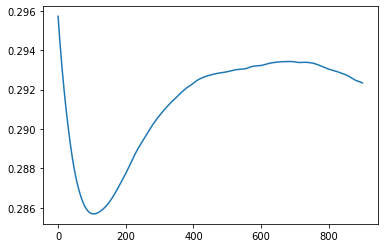

In [9]:
plt.plot(np.std(b.c[0, :, :-65].T, axis=0))

In [10]:
print(b.activation_param)
print(b.activation_param0)

10
None


In [12]:
plt.hist((b.yy).T, bins=100);

AttributeError: 'Reservoir' object has no attribute 'yy'

In [13]:
plt.plot(b.yy.T)

AttributeError: 'Reservoir' object has no attribute 'yy'

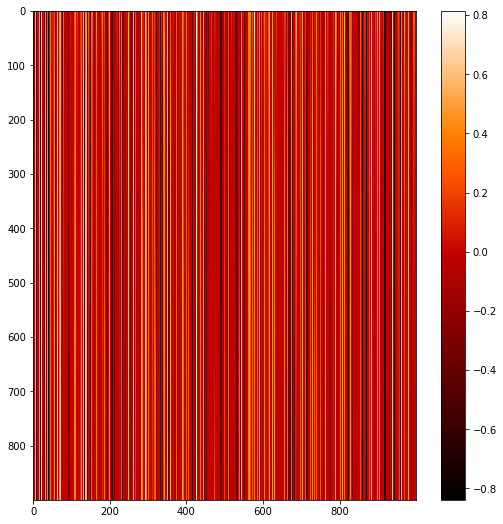

In [14]:
plt.figure(1,figsize=(9,9))
im=plt.imshow(b.c[0,:,:-65], cmap='gist_heat', interpolation='none', aspect = 1.2*b.c[0].shape[1]/b.c[0].shape[0])
plt.colorbar(im)

In [19]:
# testing data
# ks_data_test = data_utils.scale(ks_data_origin[:, n_train:, :], [0, 1])
ks_data_test = ks_data_origin[:, n_train:, :]

# Algorithm testing
b.parallel_test_runs=200
pred_output, rmse, rmse_vec, rmse_vert = b.predict_and_score(ks_data_test, detailed_score=True)

Reservoir Computing algorithm - Testing phase:

Initialization complete. 		Elapsed time: 0.0005834102630615234 s



Reservoir iterations complete. 		Elapsed time: 28.573182106018066 s
Testing complete. 			Elapsed time: 2.649070978164673 s
Testing score: 0.4916266209784881


best plot is at 118


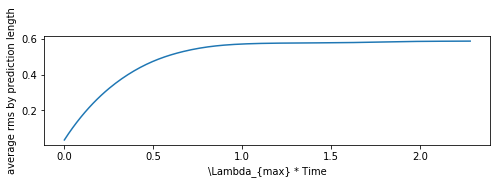

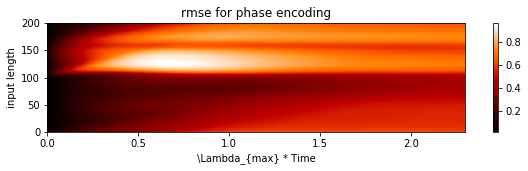

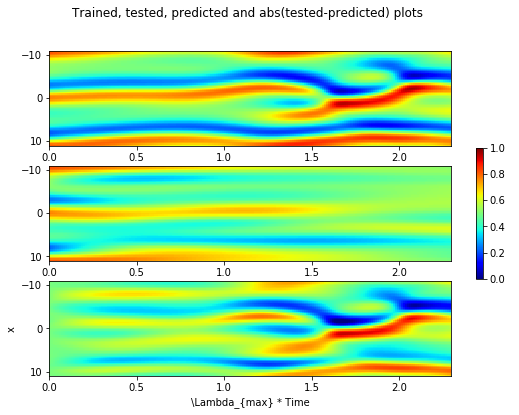

In [20]:
total_pred = (rmse.shape[1])
length_input = pred_output.shape[0] - total_pred
time_input = range(rmse.shape[0])
time_pred = tt[0:total_pred]*lyap_exp
t_min = 0
t_max = (tt[b.forget+total_pred]-tt[b.forget])*lyap_exp
x_min = xx.min()
x_max = xx.max()

plt.figure(1,figsize=(8,2))
plt.ylabel('average rms by prediction length')
plt.xlabel('\Lambda_{max} * Time')
plt.plot(time_pred[:], rmse_vec[:])
# scipy.io.savemat('time_pred_new_2.mat', dict(time_pred_new_2=time_pred))
# scipy.io.savemat('rmse_vec_new_2.mat', dict(rmse_vec_new_2=rmse_vec))
plt.show;
# plt.savefig('phase_LM_kuramoto_rmse.png', dpi=400)

plt.figure(2,figsize=(10,2))
plt.title('rmse for phase encoding')
plt.ylabel('input length')
plt.xlabel('\Lambda_{max} * Time')
im=plt.imshow(rmse[:,:], cmap='gist_heat', interpolation='nearest', 
              aspect = 0.003*total_pred/b.parallel_test_runs, 
              extent = [t_min , t_max, 0, b.parallel_test_runs])
plt.colorbar(im)
plt.show;

############################################################################
n_input = np.argmin(np.sum(rmse[:,:], axis=1)) # np.argmin(rmse_vert)
# n_input = 198
#############################################################################
total_pred = b.pred_horizon*b.rec_pred_steps

input_data = data_utils.data_preprocessing(
    ks_data_test, standardize=b.output_standardize,
    scale_min_max=b.scale_output_MinMax)[0, b.forget:b.forget+total_pred, :]
targetted_data = data_utils.data_preprocessing(
    ks_data_test, standardize=b.output_standardize,
    scale_min_max=b.scale_output_MinMax)[0, n_input+b.forget:n_input+b.forget+total_pred, :]

prediction = pred_output[n_input, :].reshape(targetted_data.shape)

vmax = max(np.concatenate((targetted_data, input_data)).flatten())
vmin = 0

# plot training data
fig, axs = plt.subplots(3, 1, sharex=False, figsize=(9,6))
plt.suptitle('Trained, tested, predicted and abs(tested-predicted) plots                       ')
plt.ylabel('x')
plt.xlabel('\Lambda_{max} * Time')

datum = [targetted_data, prediction, targetted_data-prediction+0.5]
for i in range(3):
        im=axs[i].imshow(datum[i].T, cmap=plt.get_cmap('jet'), interpolation='nearest', 
                         aspect = 0.008*total_pred/spatial_points, 
                         extent = [t_min , t_max, x_min , x_max], vmin=vmin, vmax=vmax)
        axs[i].invert_yaxis()
#     im=axs[i].pcolormesh(time_axs, xx_axs, datum[i].T, cmap=plt.get_cmap('jet'), vmin=vmin, vmax=vmax)
fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.4)
# plt.savefig('phase_SLM_kuramoto_pred.png', dpi=400)

print('best plot is at '+str(np.argmin(rmse_vert)))

In [1]:
plt.plot(rmse_vert[:])

NameError: name 'plt' is not defined